# Part 2: Spatial Interaction models

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
import seaborn as sns
import folium
import statsmodels.api as sm
import scipy.stats
import numpy as np
from math import sqrt
import statsmodels.formula.api as smf

In [2]:
cdata = pd.read_csv("London_flows.csv")

In [3]:
cdata.head()

,station_origin,station_destination,flows,population,jobs,distance
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097
1,Abbey Road,Beckton,1,599,442,8510.121774
2,Abbey Road,Blackwall,3,599,665,3775.448872
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220
4,Abbey Road,Canning Town,37,599,15428,2228.923167


In [4]:
cdata.shape

(61474, 6)

In [5]:
cdata = cdata[cdata['population']!=0]
cdata = cdata[cdata['jobs']!=0]
cdata = cdata[cdata['distance']!=0]
cdata.shape

(61413, 6)

In [6]:
cdatasubmat = pd.pivot_table(cdata, values ="flows", index="station_origin", columns = "station_destination",
                            aggfunc=np.sum, margins=True)
cdatasubmat

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,...,Wimbledon,Wimbledon Park,Wood Green,Wood Lane,Wood Street,Woodford,Woodgrange Park,Woodside Park,Woolwich Arsenal,All
station_origin,,,,,,,,,,,,,,,,,,,,,
Abbey Road,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.0,599
Acton Central,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,1224
Acton Town,NaN,NaN,NaN,3.0,17.0,NaN,35.0,0.0,NaN,11.0,...,77.0,3.0,6.0,9.0,NaN,0.0,NaN,0.0,NaN,3745
Aldgate,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0.0,NaN,17.0,...,0.0,NaN,4.0,8.0,NaN,0.0,NaN,0.0,NaN,2886
Aldgate East,NaN,NaN,2.0,0.0,NaN,NaN,0.0,0.0,NaN,20.0,...,24.0,0.0,0.0,12.0,NaN,1.0,NaN,1.0,NaN,3172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Woodford,NaN,NaN,2.0,5.0,47.0,NaN,NaN,NaN,NaN,22.0,...,2.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,4868
Woodgrange Park,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,530
Woodside Park,NaN,NaN,1.0,26.0,11.0,NaN,0.0,NaN,NaN,59.0,...,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,3093


## The Unconstrained Model

In [7]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
pd.set_option('display.max_columns', None)

x_variables = ["population", "jobs", "distance"]
log_x_vars = []
for x in x_variables:
    cdata[f"log_{x}"] = np.log(cdata[x])
    log_x_vars.append(f"log_{x}")

cdata.head()

,station_origin,station_destination,flows,population,jobs,distance,log_population,log_jobs,log_distance
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,6.395262,11.271478,9.003504
1,Abbey Road,Beckton,1,599,442,8510.121774,6.395262,6.091310,9.049012
2,Abbey Road,Blackwall,3,599,665,3775.448872,6.395262,6.499787,8.236275
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,6.395262,10.981421,8.534348
4,Abbey Road,Canning Town,37,599,15428,2228.923167,6.395262,9.643939,7.709274


In [8]:
#create the formula
formula = 'flows ~ log_population + log_jobs + log_distance'

#run the regression
uncosim = smf.glm(formula = formula, 
                  data=cdata, 
                  family=sm.families.Poisson()).fit()

In [9]:
print(uncosim.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  flows   No. Observations:                61413
Model:                            GLM   Df Residuals:                    61409
Model Family:                 Poisson   Df Model:                            3
Link Function:                    log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.2785e+06
Date:                Sun, 01 May 2022   Deviance:                   2.3848e+06
Time:                        17:49:54   Pearson chi2:                 4.76e+06
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -3.7475      0.014   -273.

In [10]:
K = uncosim.params[0]
alpha = uncosim.params[1]
gamma = uncosim.params[2]
beta = -uncosim.params[3]

In [11]:
cdata["unconstrainedEst2"] = np.exp(K 
                                       + alpha*cdata["log_population"] 
                                       + gamma*cdata["log_jobs"] 
                                       - beta*cdata["log_distance"])
predictions = uncosim.get_prediction()
predictions_summary_frame = predictions.summary_frame()
cdata["fitted"] = predictions_summary_frame["mean"]

In [12]:
cdata["unconstrainedEst2"] = round(cdata["unconstrainedEst2"], 0)
#convert to int
cdata["unconstrainedEst2"] = cdata["unconstrainedEst2"].astype(int)
#check the sum
sum(cdata["unconstrainedEst2"])

1542355

In [13]:
cdatasubmat2 = cdata.pivot_table(values ="unconstrainedEst2", index="station_origin", columns = "station_destination",
                            aggfunc=np.sum, margins=True)
cdatasubmat2

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,Archway,Arnos Grove,Arsenal,Baker Street,Balham,Bank and Monument,Barbican,Barking,Barkingside,Barons Court,Bayswater,Beckton,Beckton Park,Becontree,Belsize Park,Bermondsey,Bethnal Green,Blackfriars,Blackhorse Road,Blackwall,Bond Street,Borough,Boston Manor,Bounds Green,Bow Church,Bow Road,Brent Cross,Brentwood,Brixton,Brockley,Bromley-by-Bow,Brondesbury,Brondesbury Park,Bruce Grove,Buckhurst Hill,Burnt Oak,Bush Hill Park,Bushey,Caledonian Road,Caledonian Road & Barnsbury,Cambridge Heath,Camden Road,Camden Town,Canada Water,Canary Wharf,Canning Town,Cannon Street,Canonbury,Canons Park,Carpenders Park,Chadwell Heath,Chalfont & Latimer,Chalk Farm,Chancery Lane,Charing Cross,Chesham,Cheshunt,Chigwell,Chingford,Chiswick Park,Chorleywood,Clapham Common,Clapham High Street,Clapham Junction,Clapham North,Clapham South,Clapton,Cockfosters,Colindale,Colliers Wood,Covent Garden,Crossharbour,Crouch Hill,Croxley,Crystal Palace,Custom House,Cutty Sark,Cyprus,Dagenham East,Dagenham Heathway,Dalston Junction,Dalston Kingsland,Debden,Denmark Hill,Deptford Bridge,Devons Road,Dollis Hill,Ealing Broadway,Ealing Common,Earl's Court,East Acton,East Finchley,East Ham,East India,East Putney,Eastcote,Edgware,Edgware Road,Edmonton Green,Elephant & Castle,Elm Park,Elverson Road,Embankment,Emerson Park,Enfield Town,Epping,Euston,Euston Square,Fairlop,Farringdon,Finchley Central,Finchley Road,Finchley Road & Frognal,Finsbury Park,Forest Gate,Forest Hill,Fulham Broadway,Gallions Reach,Gants Hill,Gidea Park,Gloucester Road,Golders Green,Goldhawk Road,Goodge Street,Goodmayes,Gospel Oak,Grange Hill,Great Portland Street,Green Park,Greenford,Greenwich,Gunnersbury,Hackney Central,Hackney Downs,Hackney Wick,Haggerston,Hainault,Hammersmith,Hampstead,Hampstead Heath,Hanger Lane,Harlesden,Harold Wood,Harringay Green Lanes,Harrow & Wealdstone,Harrow-on-the-Hill,Hatch End,Hatton Cross,Headstone Lane,Heathrow Terminal 4,Heathrow Terminal 5,Heathrow Terminals 2 & 3,Hendon Central,Heron Quays,High Barnet,High Street Kensington,Highams Park,Highbury & Islington,Highgate,Hillingdon,Holborn,Holland Park,Holloway Road,Homerton,Honor Oak Park,Hornchurch,Hounslow Central,Hounslow East,Hounslow West,Hoxton,Hyde Park Corner,Ickenham,Ilford,Imperial Wharf,Island Gardens,Kennington,Kensal Green,Kensal Rise,Kensington,Kentish Town,Kentish Town West,Kenton,Kew Gardens,Kilburn,Kilburn High Road,Kilburn Park,King George V,King's Cross St. Pancras,Kingsbury,Knightsbridge,Ladbroke Grove,Lambeth North,Lancaster Gate,Langdon Park,Latimer Road,Leicester Square,Lewisham,Leyton,Leyton Midland Road,Leytonstone,Leytonstone High Road,Limehouse,Liverpool Street,London Bridge,London City Airport,London Fields,Loughton,Maida Vale,Manor House,Manor Park,Mansion House,Marble Arch,Maryland,Marylebone,Mile End,Mill Hill East,Moor Park,Moorgate,Morden,Mornington Crescent,Mudchute,Neasden,New Cross,New Cross Gate,Newbury Park,North Acton,North Ealing,North Greenwich,North Harrow,North Wembley,Northfields,Northolt,Northwick Park,Northwood,Northwood Hills,Norwood Junction,Notting Hill Gate,Oakwood,Old Street,Osterley,Oval,Oxford Circus,Paddington,Park Royal,Parsons Green,Peckham Rye,Penge West,Perivale,Piccadilly Circus,Pimlico,Pinner,Plaistow,Pontoon Dock,Poplar,Preston Road,Prince Regent,Pudding Mill Lane,Putney Bridge,Queen's Park,Queens Road Peckham,Queensbury,Queensway,Ravenscourt Park,Rayners Lane,Rectory Road,Redbridge,Regent's Park,Richmond,Rickmansworth,Roding Valley,Romford,Rotherhithe,Royal Albert,Royal Oak,Royal Victoria,Ruislip,Ruislip Gardens,Ruislip Manor,Russell Square,Seven Kings,Seven Sisters,Shadwell,Shenfield,Shepherd's Bush,Shepherd's Bush Market,Shoreditch High Street,Silver Street,Sloane Square,Snaresbrook,South Acton,South Ealing,South Hampstead,South Harrow,South Kensington,South Kenton,South Quay,South Ruislip,South Tottenham,South Wimbledon,South Woodford,Sou

In [14]:
cdatasubmat

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,Archway,Arnos Grove,Arsenal,Baker Street,Balham,Bank and Monument,Barbican,Barking,Barkingside,Barons Court,Bayswater,Beckton,Beckton Park,Becontree,Belsize Park,Bermondsey,Bethnal Green,Blackfriars,Blackhorse Road,Blackwall,Bond Street,Borough,Boston Manor,Bounds Green,Bow Church,Bow Road,Brent Cross,Brentwood,Brixton,Brockley,Bromley-by-Bow,Brondesbury,Brondesbury Park,Bruce Grove,Buckhurst Hill,Burnt Oak,Bush Hill Park,Bushey,Caledonian Road,Caledonian Road & Barnsbury,Cambridge Heath,Camden Road,Camden Town,Canada Water,Canary Wharf,Canning Town,Cannon Street,Canonbury,Canons Park,Carpenders Park,Chadwell Heath,Chalfont & Latimer,Chalk Farm,Chancery Lane,Charing Cross,Chesham,Cheshunt,Chigwell,Chingford,Chiswick Park,Chorleywood,Clapham Common,Clapham High Street,Clapham Junction,Clapham North,Clapham South,Clapton,Cockfosters,Colindale,Colliers Wood,Covent Garden,Crossharbour,Crouch Hill,Croxley,Crystal Palace,Custom House,Cutty Sark,Cyprus,Dagenham East,Dagenham Heathway,Dalston Junction,Dalston Kingsland,Debden,Denmark Hill,Deptford Bridge,Devons Road,Dollis Hill,Ealing Broadway,Ealing Common,Earl's Court,East Acton,East Finchley,East Ham,East India,East Putney,Eastcote,Edgware,Edgware Road,Edmonton Green,Elephant & Castle,Elm Park,Elverson Road,Embankment,Emerson Park,Enfield Town,Epping,Euston,Euston Square,Fairlop,Farringdon,Finchley Central,Finchley Road,Finchley Road & Frognal,Finsbury Park,Forest Gate,Forest Hill,Fulham Broadway,Gallions Reach,Gants Hill,Gidea Park,Gloucester Road,Golders Green,Goldhawk Road,Goodge Street,Goodmayes,Gospel Oak,Grange Hill,Great Portland Street,Green Park,Greenford,Greenwich,Gunnersbury,Hackney Central,Hackney Downs,Hackney Wick,Haggerston,Hainault,Hammersmith,Hampstead,Hampstead Heath,Hanger Lane,Harlesden,Harold Wood,Harringay Green Lanes,Harrow & Wealdstone,Harrow-on-the-Hill,Hatch End,Hatton Cross,Headstone Lane,Heathrow Terminal 4,Heathrow Terminal 5,Heathrow Terminals 2 & 3,Hendon Central,Heron Quays,High Barnet,High Street Kensington,Highams Park,Highbury & Islington,Highgate,Hillingdon,Holborn,Holland Park,Holloway Road,Homerton,Honor Oak Park,Hornchurch,Hounslow Central,Hounslow East,Hounslow West,Hoxton,Hyde Park Corner,Ickenham,Ilford,Imperial Wharf,Island Gardens,Kennington,Kensal Green,Kensal Rise,Kensington,Kentish Town,Kentish Town West,Kenton,Kew Gardens,Kilburn,Kilburn High Road,Kilburn Park,King George V,King's Cross St. Pancras,Kingsbury,Knightsbridge,Ladbroke Grove,Lambeth North,Lancaster Gate,Langdon Park,Latimer Road,Leicester Square,Lewisham,Leyton,Leyton Midland Road,Leytonstone,Leytonstone High Road,Limehouse,Liverpool Street,London Bridge,London City Airport,London Fields,Loughton,Maida Vale,Manor House,Manor Park,Mansion House,Marble Arch,Maryland,Marylebone,Mile End,Mill Hill East,Moor Park,Moorgate,Morden,Mornington Crescent,Mudchute,Neasden,New Cross,New Cross Gate,Newbury Park,North Acton,North Ealing,North Greenwich,North Harrow,North Wembley,Northfields,Northolt,Northwick Park,Northwood,Northwood Hills,Norwood Junction,Notting Hill Gate,Oakwood,Old Street,Osterley,Oval,Oxford Circus,Paddington,Park Royal,Parsons Green,Peckham Rye,Penge West,Perivale,Piccadilly Circus,Pimlico,Pinner,Plaistow,Pontoon Dock,Poplar,Preston Road,Prince Regent,Pudding Mill Lane,Putney Bridge,Queen's Park,Queens Road Peckham,Queensbury,Queensway,Ravenscourt Park,Rayners Lane,Rectory Road,Redbridge,Regent's Park,Richmond,Rickmansworth,Roding Valley,Romford,Rotherhithe,Royal Albert,Royal Oak,Royal Victoria,Ruislip,Ruislip Gardens,Ruislip Manor,Russell Square,Seven Kings,Seven Sisters,Shadwell,Shenfield,Shepherd's Bush,Shepherd's Bush Market,Shoreditch High Street,Silver Street,Sloane Square,Snaresbrook,South Acton,South Ealing,South Hampstead,South Harrow,South Kensington,South Kenton,South Quay,South Ruislip,South Tottenham,South Wimbledon,South Woodford,Sou

In [15]:
import scipy.stats

# calculate R2
def CalcRSqaured(observed, estimated):
    """Calculate the r^2 from a series of observed and estimated target values
    inputs:
    Observed: Series of actual observed values
    estimated: Series of predicted values"""
    r, p = scipy.stats.pearsonr(observed, estimated)
    R2 = r **2
    return R2

CalcRSqaured(cdata["flows"], cdata["unconstrainedEst2"])

0.3211903577361867

In [16]:
# calculate RMSE

def CalcRMSE(observed, estimated):
    """Calculate Root Mean Square Error between a series of observed and estimated values
    inputs:
    Observed: Series of actual observed values
    estimated: Series of predicted values"""
    res = (observed -estimated)**2
    RMSE = round(sqrt(res.mean()), 3)
    return RMSE

CalcRMSE(cdata["flows"], cdata["unconstrainedEst2"])

108.334

# Production-constrained Model

In [17]:
formula = 'flows ~ station_origin + log_jobs + log_distance-1'
#run a production constrained model
prodSim = smf.glm(formula = formula, data=cdata, family=sm.families.Poisson()).fit()
print(prodSim.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  flows   No. Observations:                61413
Model:                            GLM   Df Residuals:                    61013
Model Family:                 Poisson   Df Model:                          399
Link Function:                    log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.0169e+06
Date:                Sun, 01 May 2022   Deviance:                   1.8615e+06
Time:                        17:50:09   Pearson chi2:                 2.78e+06
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [18]:
cdata.head()

,station_origin,station_destination,flows,population,jobs,distance,log_population,log_jobs,log_distance,unconstrainedEst2,fitted
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,6.395262,11.271478,9.003504,50,49.617996
1,Abbey Road,Beckton,1,599,442,8510.121774,6.395262,6.091310,9.049012,1,0.937195
2,Abbey Road,Blackwall,3,599,665,3775.448872,6.395262,6.499787,8.236275,2,2.121375
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,6.395262,10.981421,8.534348,53,53.297014
4,Abbey Road,Canning Town,37,599,15428,2228.923167,6.395262,9.643939,7.709274,32,32.208586


In [19]:
O_i = pd.DataFrame(cdata.groupby(["station_origin"])["flows"].agg(np.sum))

O_i.rename(columns={"flows":"O_i"}, inplace = True)
cdata = cdata.merge(O_i, on = "station_origin", how = "left" )

D_j = pd.DataFrame(cdata.groupby(["station_destination"])["flows"].agg(np.sum))
D_j.rename(columns={"flows":"D_j"}, inplace = True)
cdata = cdata.merge(D_j, on = "station_destination", how = "left" )

In [20]:
D_j.head()

,D_j
station_destination,
Abbey Road,345
Acton Central,750
Acton Town,2202
Aldgate,7782
Aldgate East,7932


In [21]:
coefs = pd.DataFrame(prodSim.params)
coefs.reset_index(inplace=True)
coefs.rename(columns = {0:"alpha_i", "index":"coef"}, inplace = True)
to_repl = ["(station_origin)", "\[", "\]"]
for x in to_repl:
    coefs["coef"] = coefs["coef"].str.replace(x, "")
    
#join back
cdata = cdata.merge(coefs, left_on="station_origin", right_on="coef", how = "left")
cdata.drop(columns = ["coef"], inplace = True)
#check
cdata.head(200)

/tmp/ipykernel_4757/591784271.py:6: FutureWarning: The default value of regex will change from True to False in a future version.
  coefs["coef"] = coefs["coef"].str.replace(x, "")


,station_origin,station_destination,flows,population,jobs,distance,log_population,log_jobs,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,6.395262,11.271478,9.003504,50,49.617996,599,78549,3.250242
1,Abbey Road,Beckton,1,599,442,8510.121774,6.395262,6.091310,9.049012,1,0.937195,599,442,3.250242
2,Abbey Road,Blackwall,3,599,665,3775.448872,6.395262,6.499787,8.236275,2,2.121375,599,665,3.250242
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,6.395262,10.981421,8.534348,53,53.297014,599,58772,3.250242
4,Abbey Road,Canning Town,37,599,15428,2228.923167,6.395262,9.643939,7.709274,32,32.208586,599,15428,3.250242
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,Acton Town,Kennington,2,3745,1161,14724.378649,8.228177,7.057037,9.597260,5,5.317148,3745,1161,4.562892
196,Acton Town,Kentish Town,1,3745,3404,16459.488568,8.228177,8.132706,9.708657,11,11.244588,3745,3404,4.562892
197,Acton Town,Kew Gardens,4,3745,792,5550.141140,8.228177,6.674561,8.621579,7,7.298146,3745,792,4.562892
198,Acton Town,Kilburn,0,3745,1953,14243.513235,8.228177,7.577122,9.564057,8,8.062928,3745,1953,4.562892


In [22]:
alpha_i = prodSim.params[0:397]
gamma = prodSim.params[398]
beta = -prodSim.params[399]

In [23]:
gamma

0.7686156200124392

In [24]:
beta

0.8781191183724322

In [25]:
cdata["prodsimest1"] = np.exp(cdata["alpha_i"]+gamma*cdata["log_jobs"] 
                                 - beta*cdata["log_distance"])
#cdata["prodsimest1"] = round(cdata["prodsimest1"],0)
cdata.head(10)

,station_origin,station_destination,flows,population,jobs,distance,log_population,log_jobs,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,6.395262,11.271478,9.003504,50,49.617996,599,78549,3.250242,55.010681
1,Abbey Road,Beckton,1,599,442,8510.121774,6.395262,6.091310,9.049012,1,0.937195,599,442,3.250242,0.986106
2,Abbey Road,Blackwall,3,599,665,3775.448872,6.395262,6.499787,8.236275,2,2.121375,599,665,3.250242,2.755640
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,6.395262,10.981421,8.534348,53,53.297014,599,58772,3.250242,66.457296
4,Abbey Road,Canning Town,37,599,15428,2228.923167,6.395262,9.643939,7.709274,32,32.208586,599,15428,3.250242,49.060970
5,Abbey Road,Crossharbour,1,599,1208,6686.475560,6.395262,7.096721,8.807842,2,2.340152,599,1208,3.250242,2.639418
6,Abbey Road,Custom House,0,599,845,3824.855630,6.395262,6.739337,8.249276,3,2.524914,599,845,3.250242,3.275120
7,Abbey Road,Cutty Sark,2,599,1748,8503.898909,6.395262,7.466228,9.048280,3,2.668661,599,1748,3.250242,2.838948
8,Abbey Road,Cyprus,7,599,850,6532.099618,6.395262,6.745236,8.784484,2,1.817327,599,850,3.250242,2.056310
9,Abbey Road,Devons Road,1,599,611,3958.324171,6.395262,6.415097,8.283576,2,1.931266,599,611,3.250242,2.476929


In [26]:
CalcRSqaured(cdata["flows"], cdata["prodsimest1"])

0.388268502246241

In [27]:
CalcRMSE(cdata["flows"], cdata["prodsimest1"])

102.893

In [28]:
cdatasubmat3 = cdata.pivot_table(values ="prodsimest1", index="station_origin", columns = "station_destination",
                            aggfunc=np.sum, margins=True)
cdatasubmat3

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,Archway,Arnos Grove,Arsenal,Baker Street,Balham,Bank and Monument,Barbican,Barking,Barkingside,Barons Court,Bayswater,Beckton,Beckton Park,Becontree,Belsize Park,Bermondsey,Bethnal Green,Blackfriars,Blackhorse Road,Blackwall,Bond Street,Borough,Boston Manor,Bounds Green,Bow Church,Bow Road,Brent Cross,Brentwood,Brixton,Brockley,Bromley-by-Bow,Brondesbury,Brondesbury Park,Bruce Grove,Buckhurst Hill,Burnt Oak,Bush Hill Park,Bushey,Caledonian Road,Caledonian Road & Barnsbury,Cambridge Heath,Camden Road,Camden Town,Canada Water,Canary Wharf,Canning Town,Cannon Street,Canonbury,Canons Park,Carpenders Park,Chadwell Heath,Chalfont & Latimer,Chalk Farm,Chancery Lane,Charing Cross,Chesham,Cheshunt,Chigwell,Chingford,Chiswick Park,Chorleywood,Clapham Common,Clapham High Street,Clapham Junction,Clapham North,Clapham South,Clapton,Cockfosters,Colindale,Colliers Wood,Covent Garden,Crossharbour,Crouch Hill,Croxley,Crystal Palace,Custom House,Cutty Sark,Cyprus,Dagenham East,Dagenham Heathway,Dalston Junction,Dalston Kingsland,Debden,Denmark Hill,Deptford Bridge,Devons Road,Dollis Hill,Ealing Broadway,Ealing Common,Earl's Court,East Acton,East Finchley,East Ham,East India,East Putney,Eastcote,Edgware,Edgware Road,Edmonton Green,Elephant & Castle,Elm Park,Elverson Road,Embankment,Emerson Park,Enfield Town,Epping,Euston,Euston Square,Fairlop,Farringdon,Finchley Central,Finchley Road,Finchley Road & Frognal,Finsbury Park,Forest Gate,Forest Hill,Fulham Broadway,Gallions Reach,Gants Hill,Gidea Park,Gloucester Road,Golders Green,Goldhawk Road,Goodge Street,Goodmayes,Gospel Oak,Grange Hill,Great Portland Street,Green Park,Greenford,Greenwich,Gunnersbury,Hackney Central,Hackney Downs,Hackney Wick,Haggerston,Hainault,Hammersmith,Hampstead,Hampstead Heath,Hanger Lane,Harlesden,Harold Wood,Harringay Green Lanes,Harrow & Wealdstone,Harrow-on-the-Hill,Hatch End,Hatton Cross,Headstone Lane,Heathrow Terminal 4,Heathrow Terminal 5,Heathrow Terminals 2 & 3,Hendon Central,Heron Quays,High Barnet,High Street Kensington,Highams Park,Highbury & Islington,Highgate,Hillingdon,Holborn,Holland Park,Holloway Road,Homerton,Honor Oak Park,Hornchurch,Hounslow Central,Hounslow East,Hounslow West,Hoxton,Hyde Park Corner,Ickenham,Ilford,Imperial Wharf,Island Gardens,Kennington,Kensal Green,Kensal Rise,Kensington,Kentish Town,Kentish Town West,Kenton,Kew Gardens,Kilburn,Kilburn High Road,Kilburn Park,King George V,King's Cross St. Pancras,Kingsbury,Knightsbridge,Ladbroke Grove,Lambeth North,Lancaster Gate,Langdon Park,Latimer Road,Leicester Square,Lewisham,Leyton,Leyton Midland Road,Leytonstone,Leytonstone High Road,Limehouse,Liverpool Street,London Bridge,London City Airport,London Fields,Loughton,Maida Vale,Manor House,Manor Park,Mansion House,Marble Arch,Maryland,Marylebone,Mile End,Mill Hill East,Moor Park,Moorgate,Morden,Mornington Crescent,Mudchute,Neasden,New Cross,New Cross Gate,Newbury Park,North Acton,North Ealing,North Greenwich,North Harrow,North Wembley,Northfields,Northolt,Northwick Park,Northwood,Northwood Hills,Norwood Junction,Notting Hill Gate,Oakwood,Old Street,Osterley,Oval,Oxford Circus,Paddington,Park Royal,Parsons Green,Peckham Rye,Penge West,Perivale,Piccadilly Circus,Pimlico,Pinner,Plaistow,Pontoon Dock,Poplar,Preston Road,Prince Regent,Pudding Mill Lane,Putney Bridge,Queen's Park,Queens Road Peckham,Queensbury,Queensway,Ravenscourt Park,Rayners Lane,Rectory Road,Redbridge,Regent's Park,Richmond,Rickmansworth,Roding Valley,Romford,Rotherhithe,Royal Albert,Royal Oak,Royal Victoria,Ruislip,Ruislip Gardens,Ruislip Manor,Russell Square,Seven Kings,Seven Sisters,Shadwell,Shenfield,Shepherd's Bush,Shepherd's Bush Market,Shoreditch High Street,Silver Street,Sloane Square,Snaresbrook,South Acton,South Ealing,South Hampstead,South Harrow,South Kensington,South Kenton,South Quay,South Ruislip,South Tottenham,South Wimbledon,South Woodford,Sou

In [29]:
cdatasubmat

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,Archway,Arnos Grove,Arsenal,Baker Street,Balham,Bank and Monument,Barbican,Barking,Barkingside,Barons Court,Bayswater,Beckton,Beckton Park,Becontree,Belsize Park,Bermondsey,Bethnal Green,Blackfriars,Blackhorse Road,Blackwall,Bond Street,Borough,Boston Manor,Bounds Green,Bow Church,Bow Road,Brent Cross,Brentwood,Brixton,Brockley,Bromley-by-Bow,Brondesbury,Brondesbury Park,Bruce Grove,Buckhurst Hill,Burnt Oak,Bush Hill Park,Bushey,Caledonian Road,Caledonian Road & Barnsbury,Cambridge Heath,Camden Road,Camden Town,Canada Water,Canary Wharf,Canning Town,Cannon Street,Canonbury,Canons Park,Carpenders Park,Chadwell Heath,Chalfont & Latimer,Chalk Farm,Chancery Lane,Charing Cross,Chesham,Cheshunt,Chigwell,Chingford,Chiswick Park,Chorleywood,Clapham Common,Clapham High Street,Clapham Junction,Clapham North,Clapham South,Clapton,Cockfosters,Colindale,Colliers Wood,Covent Garden,Crossharbour,Crouch Hill,Croxley,Crystal Palace,Custom House,Cutty Sark,Cyprus,Dagenham East,Dagenham Heathway,Dalston Junction,Dalston Kingsland,Debden,Denmark Hill,Deptford Bridge,Devons Road,Dollis Hill,Ealing Broadway,Ealing Common,Earl's Court,East Acton,East Finchley,East Ham,East India,East Putney,Eastcote,Edgware,Edgware Road,Edmonton Green,Elephant & Castle,Elm Park,Elverson Road,Embankment,Emerson Park,Enfield Town,Epping,Euston,Euston Square,Fairlop,Farringdon,Finchley Central,Finchley Road,Finchley Road & Frognal,Finsbury Park,Forest Gate,Forest Hill,Fulham Broadway,Gallions Reach,Gants Hill,Gidea Park,Gloucester Road,Golders Green,Goldhawk Road,Goodge Street,Goodmayes,Gospel Oak,Grange Hill,Great Portland Street,Green Park,Greenford,Greenwich,Gunnersbury,Hackney Central,Hackney Downs,Hackney Wick,Haggerston,Hainault,Hammersmith,Hampstead,Hampstead Heath,Hanger Lane,Harlesden,Harold Wood,Harringay Green Lanes,Harrow & Wealdstone,Harrow-on-the-Hill,Hatch End,Hatton Cross,Headstone Lane,Heathrow Terminal 4,Heathrow Terminal 5,Heathrow Terminals 2 & 3,Hendon Central,Heron Quays,High Barnet,High Street Kensington,Highams Park,Highbury & Islington,Highgate,Hillingdon,Holborn,Holland Park,Holloway Road,Homerton,Honor Oak Park,Hornchurch,Hounslow Central,Hounslow East,Hounslow West,Hoxton,Hyde Park Corner,Ickenham,Ilford,Imperial Wharf,Island Gardens,Kennington,Kensal Green,Kensal Rise,Kensington,Kentish Town,Kentish Town West,Kenton,Kew Gardens,Kilburn,Kilburn High Road,Kilburn Park,King George V,King's Cross St. Pancras,Kingsbury,Knightsbridge,Ladbroke Grove,Lambeth North,Lancaster Gate,Langdon Park,Latimer Road,Leicester Square,Lewisham,Leyton,Leyton Midland Road,Leytonstone,Leytonstone High Road,Limehouse,Liverpool Street,London Bridge,London City Airport,London Fields,Loughton,Maida Vale,Manor House,Manor Park,Mansion House,Marble Arch,Maryland,Marylebone,Mile End,Mill Hill East,Moor Park,Moorgate,Morden,Mornington Crescent,Mudchute,Neasden,New Cross,New Cross Gate,Newbury Park,North Acton,North Ealing,North Greenwich,North Harrow,North Wembley,Northfields,Northolt,Northwick Park,Northwood,Northwood Hills,Norwood Junction,Notting Hill Gate,Oakwood,Old Street,Osterley,Oval,Oxford Circus,Paddington,Park Royal,Parsons Green,Peckham Rye,Penge West,Perivale,Piccadilly Circus,Pimlico,Pinner,Plaistow,Pontoon Dock,Poplar,Preston Road,Prince Regent,Pudding Mill Lane,Putney Bridge,Queen's Park,Queens Road Peckham,Queensbury,Queensway,Ravenscourt Park,Rayners Lane,Rectory Road,Redbridge,Regent's Park,Richmond,Rickmansworth,Roding Valley,Romford,Rotherhithe,Royal Albert,Royal Oak,Royal Victoria,Ruislip,Ruislip Gardens,Ruislip Manor,Russell Square,Seven Kings,Seven Sisters,Shadwell,Shenfield,Shepherd's Bush,Shepherd's Bush Market,Shoreditch High Street,Silver Street,Sloane Square,Snaresbrook,South Acton,South Ealing,South Hampstead,South Harrow,South Kensington,South Kenton,South Quay,South Ruislip,South Tottenham,South Wimbledon,South Woodford,Sou

## Attraction-Constrained Model

In [30]:
attr_form = 'flows ~ station_destination + log_population + log_distance-1'
#run a Attraction constrained model
attrSim = smf.glm(formula = attr_form, data=cdata, family=sm.families.Poisson()).fit()
print(attrSim.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  flows   No. Observations:                61413
Model:                            GLM   Df Residuals:                    61013
Model Family:                 Poisson   Df Model:                          399
Link Function:                    log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.1646e+06
Date:                Sun, 01 May 2022   Deviance:                   2.1570e+06
Time:                        17:50:29   Pearson chi2:                 3.65e+06
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
                                                       coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------

In [31]:
# predictions = attrSim.get_prediction(cdata[["station_destination", "log_jobs", "log_distance"]])
# predictions_summary_frame = predictions.summary_frame()
# cdata["attrsimFitted"] = round(predictions_summary_frame["mean"],0)

cdata["attrsimFitted"] = np.round(attrSim.mu)

In [32]:
cdatasubmat_attr = cdata.pivot_table(values ="attrsimFitted", index="station_origin", columns = "station_destination",
                                    aggfunc=np.sum, margins=True)
cdatasubmat_attr

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,Archway,Arnos Grove,Arsenal,Baker Street,Balham,Bank and Monument,Barbican,Barking,Barkingside,Barons Court,Bayswater,Beckton,Beckton Park,Becontree,Belsize Park,Bermondsey,Bethnal Green,Blackfriars,Blackhorse Road,Blackwall,Bond Street,Borough,Boston Manor,Bounds Green,Bow Church,Bow Road,Brent Cross,Brentwood,Brixton,Brockley,Bromley-by-Bow,Brondesbury,Brondesbury Park,Bruce Grove,Buckhurst Hill,Burnt Oak,Bush Hill Park,Bushey,Caledonian Road,Caledonian Road & Barnsbury,Cambridge Heath,Camden Road,Camden Town,Canada Water,Canary Wharf,Canning Town,Cannon Street,Canonbury,Canons Park,Carpenders Park,Chadwell Heath,Chalfont & Latimer,Chalk Farm,Chancery Lane,Charing Cross,Chesham,Cheshunt,Chigwell,Chingford,Chiswick Park,Chorleywood,Clapham Common,Clapham High Street,Clapham Junction,Clapham North,Clapham South,Clapton,Cockfosters,Colindale,Colliers Wood,Covent Garden,Crossharbour,Crouch Hill,Croxley,Crystal Palace,Custom House,Cutty Sark,Cyprus,Dagenham East,Dagenham Heathway,Dalston Junction,Dalston Kingsland,Debden,Denmark Hill,Deptford Bridge,Devons Road,Dollis Hill,Ealing Broadway,Ealing Common,Earl's Court,East Acton,East Finchley,East Ham,East India,East Putney,Eastcote,Edgware,Edgware Road,Edmonton Green,Elephant & Castle,Elm Park,Elverson Road,Embankment,Emerson Park,Enfield Town,Epping,Euston,Euston Square,Fairlop,Farringdon,Finchley Central,Finchley Road,Finchley Road & Frognal,Finsbury Park,Forest Gate,Forest Hill,Fulham Broadway,Gallions Reach,Gants Hill,Gidea Park,Gloucester Road,Golders Green,Goldhawk Road,Goodge Street,Goodmayes,Gospel Oak,Grange Hill,Great Portland Street,Green Park,Greenford,Greenwich,Gunnersbury,Hackney Central,Hackney Downs,Hackney Wick,Haggerston,Hainault,Hammersmith,Hampstead,Hampstead Heath,Hanger Lane,Harlesden,Harold Wood,Harringay Green Lanes,Harrow & Wealdstone,Harrow-on-the-Hill,Hatch End,Hatton Cross,Headstone Lane,Heathrow Terminal 4,Heathrow Terminal 5,Heathrow Terminals 2 & 3,Hendon Central,Heron Quays,High Barnet,High Street Kensington,Highams Park,Highbury & Islington,Highgate,Hillingdon,Holborn,Holland Park,Holloway Road,Homerton,Honor Oak Park,Hornchurch,Hounslow Central,Hounslow East,Hounslow West,Hoxton,Hyde Park Corner,Ickenham,Ilford,Imperial Wharf,Island Gardens,Kennington,Kensal Green,Kensal Rise,Kensington,Kentish Town,Kentish Town West,Kenton,Kew Gardens,Kilburn,Kilburn High Road,Kilburn Park,King George V,King's Cross St. Pancras,Kingsbury,Knightsbridge,Ladbroke Grove,Lambeth North,Lancaster Gate,Langdon Park,Latimer Road,Leicester Square,Lewisham,Leyton,Leyton Midland Road,Leytonstone,Leytonstone High Road,Limehouse,Liverpool Street,London Bridge,London City Airport,London Fields,Loughton,Maida Vale,Manor House,Manor Park,Mansion House,Marble Arch,Maryland,Marylebone,Mile End,Mill Hill East,Moor Park,Moorgate,Morden,Mornington Crescent,Mudchute,Neasden,New Cross,New Cross Gate,Newbury Park,North Acton,North Ealing,North Greenwich,North Harrow,North Wembley,Northfields,Northolt,Northwick Park,Northwood,Northwood Hills,Norwood Junction,Notting Hill Gate,Oakwood,Old Street,Osterley,Oval,Oxford Circus,Paddington,Park Royal,Parsons Green,Peckham Rye,Penge West,Perivale,Piccadilly Circus,Pimlico,Pinner,Plaistow,Pontoon Dock,Poplar,Preston Road,Prince Regent,Pudding Mill Lane,Putney Bridge,Queen's Park,Queens Road Peckham,Queensbury,Queensway,Ravenscourt Park,Rayners Lane,Rectory Road,Redbridge,Regent's Park,Richmond,Rickmansworth,Roding Valley,Romford,Rotherhithe,Royal Albert,Royal Oak,Royal Victoria,Ruislip,Ruislip Gardens,Ruislip Manor,Russell Square,Seven Kings,Seven Sisters,Shadwell,Shenfield,Shepherd's Bush,Shepherd's Bush Market,Shoreditch High Street,Silver Street,Sloane Square,Snaresbrook,South Acton,South Ealing,South Hampstead,South Harrow,South Kensington,South Kenton,South Quay,South Ruislip,South Tottenham,South Wimbledon,South Woodford,Sou

In [33]:
cdata.head(20)

,station_origin,station_destination,flows,population,jobs,distance,log_population,log_jobs,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,attrsimFitted
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,6.395262,11.271478,9.003504,50,49.617996,599,78549,3.250242,55.010681,53.0
1,Abbey Road,Beckton,1,599,442,8510.121774,6.395262,6.091310,9.049012,1,0.937195,599,442,3.250242,0.986106,3.0
2,Abbey Road,Blackwall,3,599,665,3775.448872,6.395262,6.499787,8.236275,2,2.121375,599,665,3.250242,2.755640,4.0
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,6.395262,10.981421,8.534348,53,53.297014,599,58772,3.250242,66.457296,70.0
4,Abbey Road,Canning Town,37,599,15428,2228.923167,6.395262,9.643939,7.709274,32,32.208586,599,15428,3.250242,49.060970,33.0
5,Abbey Road,Crossharbour,1,599,1208,6686.475560,6.395262,7.096721,8.807842,2,2.340152,599,1208,3.250242,2.639418,5.0
6,Abbey Road,Custom House,0,599,845,3824.855630,6.395262,6.739337,8.249276,3,2.524914,599,845,3.250242,3.275120,5.0
7,Abbey Road,Cutty Sark,2,599,1748,8503.898909,6.395262,7.466228,9.048280,3,2.668661,599,1748,3.250242,2.838948,8.0
8,Abbey Road,Cyprus,7,599,850,6532.099618,6.395262,6.745236,8.784484,2,1.817327,599,850,3.250242,2.056310,5.0
9,Abbey Road,Devons Road,1,599,611,3958.324171,6.395262,6.415097,8.283576,2,1.931266,599,611,3.250242,2.476929,4.0


In [34]:
CalcRSqaured(cdata["flows"],cdata["attrsimFitted"])

0.3499323840939915

In [35]:
CalcRMSE(cdata["flows"], cdata["attrsimFitted"])

106.013

## The Doubly Constrained Model

In [36]:
dbl_form = 'flows ~ station_destination	 + station_origin + log_distance-1'
#run a doubly constrained model
doubSim = smf.glm(formula = dbl_form, data=cdata, family=sm.families.Poisson()).fit()
print(doubSim.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  flows   No. Observations:                61413
Model:                            GLM   Df Residuals:                    60617
Model Family:                 Poisson   Df Model:                          795
Link Function:                    log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -9.7074e+05
Date:                Sun, 01 May 2022   Deviance:                   1.7693e+06
Time:                        17:51:13   Pearson chi2:                 2.47e+06
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
                                                       coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------

In [37]:
cdata["doubsimfitted"] = np.round(doubSim.mu)

In [38]:
CalcRSqaured(cdata["flows"],cdata["doubsimfitted"])

0.40768532292960646

In [39]:
CalcRMSE(cdata["flows"],cdata["doubsimfitted"])

101.335

# Scenario A

In [40]:
def new_job(row):
    if row["station_destination"] == "Canary Wharf":
        val = row["jobs"] * 0.5
    else:
        val = row["jobs"]
    return val

cdata["new_jobs"] = cdata.apply(new_job, axis =1)
cdata.head(10)

,station_origin,station_destination,flows,population,jobs,distance,log_population,log_jobs,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,attrsimFitted,doubsimfitted,new_jobs
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,6.395262,11.271478,9.003504,50,49.617996,599,78549,3.250242,55.010681,53.0,55.0,78549.0
1,Abbey Road,Beckton,1,599,442,8510.121774,6.395262,6.091310,9.049012,1,0.937195,599,442,3.250242,0.986106,3.0,2.0,442.0
2,Abbey Road,Blackwall,3,599,665,3775.448872,6.395262,6.499787,8.236275,2,2.121375,599,665,3.250242,2.755640,4.0,3.0,665.0
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,6.395262,10.981421,8.534348,53,53.297014,599,58772,3.250242,66.457296,70.0,77.0,29386.0
4,Abbey Road,Canning Town,37,599,15428,2228.923167,6.395262,9.643939,7.709274,32,32.208586,599,15428,3.250242,49.060970,33.0,45.0,15428.0
5,Abbey Road,Crossharbour,1,599,1208,6686.475560,6.395262,7.096721,8.807842,2,2.340152,599,1208,3.250242,2.639418,5.0,3.0,1208.0
6,Abbey Road,Custom House,0,599,845,3824.855630,6.395262,6.739337,8.249276,3,2.524914,599,845,3.250242,3.275120,5.0,4.0,845.0
7,Abbey Road,Cutty Sark,2,599,1748,8503.898909,6.395262,7.466228,9.048280,3,2.668661,599,1748,3.250242,2.838948,8.0,5.0,1748.0
8,Abbey Road,Cyprus,7,599,850,6532.099618,6.395262,6.745236,8.784484,2,1.817327,599,850,3.250242,2.056310,5.0,4.0,850.0
9,Abbey Road,Devons Road,1,599,611,3958.324171,6.395262,6.415097,8.283576,2,1.931266,599,611,3.250242,2.476929,4.0,3.0,611.0


In [41]:
# cdata["prodsimest2"] = np.exp(cdata["alpha_i"]+gamma*np.log(cdata["new_jobs"]) 
#                                  - beta*cdata["log_distance"])

# cdata["prodsimest2"] = round(cdata["prodsimest2"],0)
# #now we can convert the pivot table into a matrix
# cdatasubmat4 = cdata.pivot_table(values ="prodsimest2", index="station_origin", columns = "station_destination",
#                             aggfunc=np.sum, margins=True)
# cdatasubmat4

In [42]:
#cdatasubmat4["Canary Wharf"].iloc[12:]

In [43]:
beta = 0.9096

Dj2_gamma = cdata["new_jobs"]**gamma
dist_beta = cdata["distance"]**-beta
cdata["Ai1"] = Dj2_gamma * dist_beta
A_i = pd.DataFrame(cdata.groupby(["station_origin"])["Ai1"].agg(np.sum))
A_i["Ai1"] = 1/A_i["Ai1"]
A_i.rename(columns={"Ai1":"A_i"}, inplace=True)
#write the A_i values back
cdata = cdata.merge(A_i, left_on="station_origin", right_index=True, how="left")

In [44]:
cdata["prodsimest3"] = cdata["A_i"]*cdata["O_i"]*Dj2_gamma*dist_beta
#round
cdata["prodsimest3"] = round(cdata["prodsimest3"])
#check
cdata[["flows", "prodsimest3"]]

,flows,prodsimest3
0,0,55.0
1,1,1.0
2,3,3.0
3,1,40.0
4,37,51.0
...,...,...
61408,127,130.0
61409,608,281.0
61410,6,35.0
61411,81,108.0


In [45]:
cdatasubmat5 = cdata.pivot_table(values ="prodsimest3", index="station_origin", columns = "station_destination",
                            aggfunc=np.sum, margins=True)
cdatasubmat5

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,Archway,Arnos Grove,Arsenal,Baker Street,Balham,Bank and Monument,Barbican,Barking,Barkingside,Barons Court,Bayswater,Beckton,Beckton Park,Becontree,Belsize Park,Bermondsey,Bethnal Green,Blackfriars,Blackhorse Road,Blackwall,Bond Street,Borough,Boston Manor,Bounds Green,Bow Church,Bow Road,Brent Cross,Brentwood,Brixton,Brockley,Bromley-by-Bow,Brondesbury,Brondesbury Park,Bruce Grove,Buckhurst Hill,Burnt Oak,Bush Hill Park,Bushey,Caledonian Road,Caledonian Road & Barnsbury,Cambridge Heath,Camden Road,Camden Town,Canada Water,Canary Wharf,Canning Town,Cannon Street,Canonbury,Canons Park,Carpenders Park,Chadwell Heath,Chalfont & Latimer,Chalk Farm,Chancery Lane,Charing Cross,Chesham,Cheshunt,Chigwell,Chingford,Chiswick Park,Chorleywood,Clapham Common,Clapham High Street,Clapham Junction,Clapham North,Clapham South,Clapton,Cockfosters,Colindale,Colliers Wood,Covent Garden,Crossharbour,Crouch Hill,Croxley,Crystal Palace,Custom House,Cutty Sark,Cyprus,Dagenham East,Dagenham Heathway,Dalston Junction,Dalston Kingsland,Debden,Denmark Hill,Deptford Bridge,Devons Road,Dollis Hill,Ealing Broadway,Ealing Common,Earl's Court,East Acton,East Finchley,East Ham,East India,East Putney,Eastcote,Edgware,Edgware Road,Edmonton Green,Elephant & Castle,Elm Park,Elverson Road,Embankment,Emerson Park,Enfield Town,Epping,Euston,Euston Square,Fairlop,Farringdon,Finchley Central,Finchley Road,Finchley Road & Frognal,Finsbury Park,Forest Gate,Forest Hill,Fulham Broadway,Gallions Reach,Gants Hill,Gidea Park,Gloucester Road,Golders Green,Goldhawk Road,Goodge Street,Goodmayes,Gospel Oak,Grange Hill,Great Portland Street,Green Park,Greenford,Greenwich,Gunnersbury,Hackney Central,Hackney Downs,Hackney Wick,Haggerston,Hainault,Hammersmith,Hampstead,Hampstead Heath,Hanger Lane,Harlesden,Harold Wood,Harringay Green Lanes,Harrow & Wealdstone,Harrow-on-the-Hill,Hatch End,Hatton Cross,Headstone Lane,Heathrow Terminal 4,Heathrow Terminal 5,Heathrow Terminals 2 & 3,Hendon Central,Heron Quays,High Barnet,High Street Kensington,Highams Park,Highbury & Islington,Highgate,Hillingdon,Holborn,Holland Park,Holloway Road,Homerton,Honor Oak Park,Hornchurch,Hounslow Central,Hounslow East,Hounslow West,Hoxton,Hyde Park Corner,Ickenham,Ilford,Imperial Wharf,Island Gardens,Kennington,Kensal Green,Kensal Rise,Kensington,Kentish Town,Kentish Town West,Kenton,Kew Gardens,Kilburn,Kilburn High Road,Kilburn Park,King George V,King's Cross St. Pancras,Kingsbury,Knightsbridge,Ladbroke Grove,Lambeth North,Lancaster Gate,Langdon Park,Latimer Road,Leicester Square,Lewisham,Leyton,Leyton Midland Road,Leytonstone,Leytonstone High Road,Limehouse,Liverpool Street,London Bridge,London City Airport,London Fields,Loughton,Maida Vale,Manor House,Manor Park,Mansion House,Marble Arch,Maryland,Marylebone,Mile End,Mill Hill East,Moor Park,Moorgate,Morden,Mornington Crescent,Mudchute,Neasden,New Cross,New Cross Gate,Newbury Park,North Acton,North Ealing,North Greenwich,North Harrow,North Wembley,Northfields,Northolt,Northwick Park,Northwood,Northwood Hills,Norwood Junction,Notting Hill Gate,Oakwood,Old Street,Osterley,Oval,Oxford Circus,Paddington,Park Royal,Parsons Green,Peckham Rye,Penge West,Perivale,Piccadilly Circus,Pimlico,Pinner,Plaistow,Pontoon Dock,Poplar,Preston Road,Prince Regent,Pudding Mill Lane,Putney Bridge,Queen's Park,Queens Road Peckham,Queensbury,Queensway,Ravenscourt Park,Rayners Lane,Rectory Road,Redbridge,Regent's Park,Richmond,Rickmansworth,Roding Valley,Romford,Rotherhithe,Royal Albert,Royal Oak,Royal Victoria,Ruislip,Ruislip Gardens,Ruislip Manor,Russell Square,Seven Kings,Seven Sisters,Shadwell,Shenfield,Shepherd's Bush,Shepherd's Bush Market,Shoreditch High Street,Silver Street,Sloane Square,Snaresbrook,South Acton,South Ealing,South Hampstead,South Harrow,South Kensington,South Kenton,South Quay,South Ruislip,South Tottenham,South Wimbledon,South Woodford,Sou

In [46]:
cdatasubmat5["Canary Wharf"]

station_origin
Abbey Road             40.0
Acton Central           NaN
Acton Town             42.0
Aldgate                33.0
Aldgate East           47.0
                     ...   
Woodford              111.0
Woodgrange Park         NaN
Woodside Park          45.0
Woolwich Arsenal      911.0
All                 31301.0
Name: Canary Wharf, Length: 399, dtype: float64

In [47]:
cdatasubmat["Canary Wharf"]

station_origin
Abbey Road              1.0
Acton Central           NaN
Acton Town             57.0
Aldgate                 1.0
Aldgate East            3.0
                     ...   
Woodford              192.0
Woodgrange Park         NaN
Woodside Park          42.0
Woolwich Arsenal       82.0
All                 58772.0
Name: Canary Wharf, Length: 399, dtype: float64

In [48]:
ScenarioA = pd.DataFrame()
ScenarioA['change'] = cdatasubmat5["Canary Wharf"]-cdatasubmat["Canary Wharf"]
ScenarioA['change'].fillna(0,  inplace=True)
ScenarioA.drop(ScenarioA.tail(1).index, inplace=True)

ScenarioA['abs'] = abs(ScenarioA['change'])

ScenarioA.sort_values(by='abs', ascending = False).head(10)

,change,abs
station_origin,,
Waterloo,-7437.0,7437.0
London Bridge,-5762.0,5762.0
Canada Water,-2950.0,2950.0
Stratford,-2409.0,2409.0
Bank and Monument,-2010.0,2010.0
Southwark,-1376.0,1376.0
Heron Quays,888.0,888.0
Woolwich Arsenal,829.0,829.0
Lewisham,-809.0,809.0


In [49]:
import networkx as nx
G = nx.read_graphml('london.graph')
G_A = G.copy()
nx.set_node_attributes(G_A, 0,'ScenarioA')

for i in ScenarioA.index:
    G_A.add_node(i, ScenarioA = float(ScenarioA.loc[i,'change']) )
    #print(type(float(ScenarioA.loc[i,'change'])))


In [50]:
list(G_A.nodes(data = True))[0]

('Wembley Park',
 {'coords': '(519316.5590174915, 186389.32981656672)', 'ScenarioA': -135.0})

In [51]:
for node in G_A.nodes():
    G_A.nodes[node]['coords'] = eval(G_A.nodes[node]['coords'])

In [52]:
list(G_A.nodes(data = True))[0]

('Wembley Park',
 {'coords': (519316.5590174915, 186389.32981656672), 'ScenarioA': -135.0})

In [53]:
print(G_A.nodes['Battersea Park'])

{'coords': (528748.1639735023, 177080.47227988567), 'ScenarioA': 0}


In [54]:
deg_color=[]
for i, node in G_A.nodes(data=True):
    #print(i)
    #print(type(node['ScenarioA']))
    deg_color.append(node['ScenarioA'])

print(deg_color)

[-135.0, -71.0, -106.0, -129.0, -169.0, -2409.0, -357.0, -293.0, -761.0, 0.0, -2950.0, -791.0, -5762.0, -1376.0, -7437.0, -244.0, -213.0, -272.0, -629.0, -354.0, -326.0, -244.0, -31.0, -35.0, -139.0, -177.0, -581.0, -8.0, -68.0, 7.0, 7.0, 1.0, -1.0, 4.0, -12.0, 1.0, -9.0, -2.0, -12.0, -88.0, -52.0, -129.0, -75.0, -96.0, -35.0, -7.0, -7.0, 10.0, 9.0, 9.0, -2010.0, 314.0, 39.0, 140.0, -8.0, 7.0, -14.0, -73.0, -81.0, -19.0, -43.0, -17.0, -15.0, -42.0, -11.0, -29.0, -71.0, -27.0, -17.0, -3.0, -13.0, -4.0, -12.0, -4.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 64.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 17.0, 0.0, 0.0, 192.0, 0.0, 0.0, 0.0, 57.0, -28.0, 2.0, 0.0, 11.0, 20.0, 7.0, 8.0, 6.0, 7.0, 5.0, 33.0, -3.0, -51.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 207.0, 0.0, 0.0, 0.0, 0.0, 0.0, 254.0, -107.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.0, 0.0, 0.0, -344.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 55.0, 0.0, 0.0, 0.0, 0

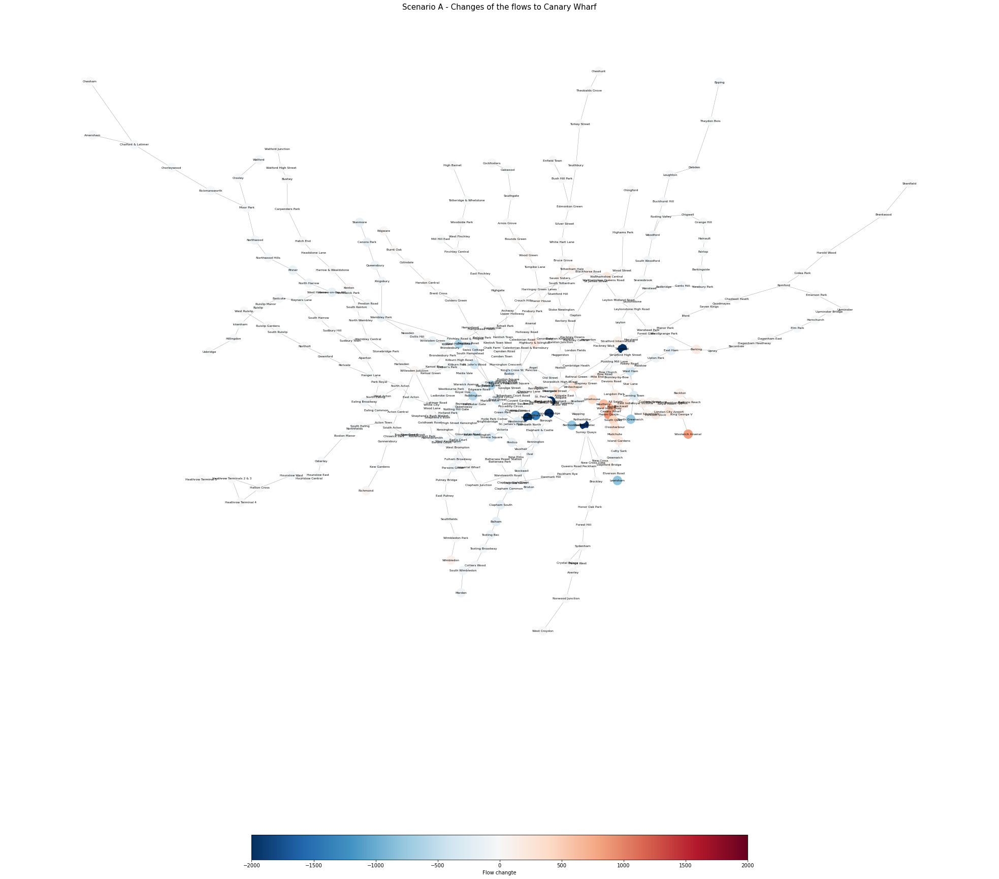

In [55]:
import matplotlib.pyplot as plt
# plot
pos = nx.get_node_attributes(G_A, 'coords')

fig, ax = plt.subplots(figsize=(35,35))
nx.draw_networkx_labels(G_A, pos,font_size=6, font_color='black')
nx.draw_networkx_edges(G_A, pos,edge_color='gray',  width=0.4)
nod=nx.draw_networkx_nodes(G_A, pos = pos, node_color= deg_color, vmin=-2000,vmax=2000, cmap=plt.get_cmap('RdBu_r'))

plt.colorbar(nod,label="Flow changte",orientation="horizontal", shrink=0.5)
plt.axis("off")
plt.title("Scenario A - Changes of the flows to Canary Wharf",fontsize=15)
plt.show()

## Scenario B

In [56]:
new_beta = 1.5
Dj2_gamma_s2 = cdata["jobs"]**gamma
dist_beta_s2 = cdata["distance"]**-new_beta
cdata["Ai1_s2"] = Dj2_gamma_s2 * dist_beta_s2
A_i_s2 = pd.DataFrame(cdata.groupby(["station_origin"])["Ai1_s2"].agg(np.sum))
A_i_s2["Ai1_s2"] = 1/A_i_s2["Ai1_s2"]
A_i_s2.rename(columns={"Ai1_s2":"A_i_s2"}, inplace=True)
#write the A_i values back
cdata = cdata.merge(A_i_s2, left_on="station_origin", right_index=True, how="left")


cdata["prodsimest_s2"] = cdata["A_i_s2"]*cdata["O_i"]*Dj2_gamma_s2*dist_beta_s2

cdata["prodsimest_s2"] = round(cdata["prodsimest_s2"],0)
cdata["prodsimest_s2"]
#pivot table
cdatasubmat_s21 = cdata.pivot_table(values ="prodsimest_s2", index="station_origin", columns = "station_destination",
                            aggfunc=np.sum, margins=True)
cdatasubmat_s21

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,Archway,Arnos Grove,Arsenal,Baker Street,Balham,Bank and Monument,Barbican,Barking,Barkingside,Barons Court,Bayswater,Beckton,Beckton Park,Becontree,Belsize Park,Bermondsey,Bethnal Green,Blackfriars,Blackhorse Road,Blackwall,Bond Street,Borough,Boston Manor,Bounds Green,Bow Church,Bow Road,Brent Cross,Brentwood,Brixton,Brockley,Bromley-by-Bow,Brondesbury,Brondesbury Park,Bruce Grove,Buckhurst Hill,Burnt Oak,Bush Hill Park,Bushey,Caledonian Road,Caledonian Road & Barnsbury,Cambridge Heath,Camden Road,Camden Town,Canada Water,Canary Wharf,Canning Town,Cannon Street,Canonbury,Canons Park,Carpenders Park,Chadwell Heath,Chalfont & Latimer,Chalk Farm,Chancery Lane,Charing Cross,Chesham,Cheshunt,Chigwell,Chingford,Chiswick Park,Chorleywood,Clapham Common,Clapham High Street,Clapham Junction,Clapham North,Clapham South,Clapton,Cockfosters,Colindale,Colliers Wood,Covent Garden,Crossharbour,Crouch Hill,Croxley,Crystal Palace,Custom House,Cutty Sark,Cyprus,Dagenham East,Dagenham Heathway,Dalston Junction,Dalston Kingsland,Debden,Denmark Hill,Deptford Bridge,Devons Road,Dollis Hill,Ealing Broadway,Ealing Common,Earl's Court,East Acton,East Finchley,East Ham,East India,East Putney,Eastcote,Edgware,Edgware Road,Edmonton Green,Elephant & Castle,Elm Park,Elverson Road,Embankment,Emerson Park,Enfield Town,Epping,Euston,Euston Square,Fairlop,Farringdon,Finchley Central,Finchley Road,Finchley Road & Frognal,Finsbury Park,Forest Gate,Forest Hill,Fulham Broadway,Gallions Reach,Gants Hill,Gidea Park,Gloucester Road,Golders Green,Goldhawk Road,Goodge Street,Goodmayes,Gospel Oak,Grange Hill,Great Portland Street,Green Park,Greenford,Greenwich,Gunnersbury,Hackney Central,Hackney Downs,Hackney Wick,Haggerston,Hainault,Hammersmith,Hampstead,Hampstead Heath,Hanger Lane,Harlesden,Harold Wood,Harringay Green Lanes,Harrow & Wealdstone,Harrow-on-the-Hill,Hatch End,Hatton Cross,Headstone Lane,Heathrow Terminal 4,Heathrow Terminal 5,Heathrow Terminals 2 & 3,Hendon Central,Heron Quays,High Barnet,High Street Kensington,Highams Park,Highbury & Islington,Highgate,Hillingdon,Holborn,Holland Park,Holloway Road,Homerton,Honor Oak Park,Hornchurch,Hounslow Central,Hounslow East,Hounslow West,Hoxton,Hyde Park Corner,Ickenham,Ilford,Imperial Wharf,Island Gardens,Kennington,Kensal Green,Kensal Rise,Kensington,Kentish Town,Kentish Town West,Kenton,Kew Gardens,Kilburn,Kilburn High Road,Kilburn Park,King George V,King's Cross St. Pancras,Kingsbury,Knightsbridge,Ladbroke Grove,Lambeth North,Lancaster Gate,Langdon Park,Latimer Road,Leicester Square,Lewisham,Leyton,Leyton Midland Road,Leytonstone,Leytonstone High Road,Limehouse,Liverpool Street,London Bridge,London City Airport,London Fields,Loughton,Maida Vale,Manor House,Manor Park,Mansion House,Marble Arch,Maryland,Marylebone,Mile End,Mill Hill East,Moor Park,Moorgate,Morden,Mornington Crescent,Mudchute,Neasden,New Cross,New Cross Gate,Newbury Park,North Acton,North Ealing,North Greenwich,North Harrow,North Wembley,Northfields,Northolt,Northwick Park,Northwood,Northwood Hills,Norwood Junction,Notting Hill Gate,Oakwood,Old Street,Osterley,Oval,Oxford Circus,Paddington,Park Royal,Parsons Green,Peckham Rye,Penge West,Perivale,Piccadilly Circus,Pimlico,Pinner,Plaistow,Pontoon Dock,Poplar,Preston Road,Prince Regent,Pudding Mill Lane,Putney Bridge,Queen's Park,Queens Road Peckham,Queensbury,Queensway,Ravenscourt Park,Rayners Lane,Rectory Road,Redbridge,Regent's Park,Richmond,Rickmansworth,Roding Valley,Romford,Rotherhithe,Royal Albert,Royal Oak,Royal Victoria,Ruislip,Ruislip Gardens,Ruislip Manor,Russell Square,Seven Kings,Seven Sisters,Shadwell,Shenfield,Shepherd's Bush,Shepherd's Bush Market,Shoreditch High Street,Silver Street,Sloane Square,Snaresbrook,South Acton,South Ealing,South Hampstead,South Harrow,South Kensington,South Kenton,South Quay,South Ruislip,South Tottenham,South Wimbledon,South Woodford,Sou

In [57]:
cdatasubmat

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,Archway,Arnos Grove,Arsenal,Baker Street,Balham,Bank and Monument,Barbican,Barking,Barkingside,Barons Court,Bayswater,Beckton,Beckton Park,Becontree,Belsize Park,Bermondsey,Bethnal Green,Blackfriars,Blackhorse Road,Blackwall,Bond Street,Borough,Boston Manor,Bounds Green,Bow Church,Bow Road,Brent Cross,Brentwood,Brixton,Brockley,Bromley-by-Bow,Brondesbury,Brondesbury Park,Bruce Grove,Buckhurst Hill,Burnt Oak,Bush Hill Park,Bushey,Caledonian Road,Caledonian Road & Barnsbury,Cambridge Heath,Camden Road,Camden Town,Canada Water,Canary Wharf,Canning Town,Cannon Street,Canonbury,Canons Park,Carpenders Park,Chadwell Heath,Chalfont & Latimer,Chalk Farm,Chancery Lane,Charing Cross,Chesham,Cheshunt,Chigwell,Chingford,Chiswick Park,Chorleywood,Clapham Common,Clapham High Street,Clapham Junction,Clapham North,Clapham South,Clapton,Cockfosters,Colindale,Colliers Wood,Covent Garden,Crossharbour,Crouch Hill,Croxley,Crystal Palace,Custom House,Cutty Sark,Cyprus,Dagenham East,Dagenham Heathway,Dalston Junction,Dalston Kingsland,Debden,Denmark Hill,Deptford Bridge,Devons Road,Dollis Hill,Ealing Broadway,Ealing Common,Earl's Court,East Acton,East Finchley,East Ham,East India,East Putney,Eastcote,Edgware,Edgware Road,Edmonton Green,Elephant & Castle,Elm Park,Elverson Road,Embankment,Emerson Park,Enfield Town,Epping,Euston,Euston Square,Fairlop,Farringdon,Finchley Central,Finchley Road,Finchley Road & Frognal,Finsbury Park,Forest Gate,Forest Hill,Fulham Broadway,Gallions Reach,Gants Hill,Gidea Park,Gloucester Road,Golders Green,Goldhawk Road,Goodge Street,Goodmayes,Gospel Oak,Grange Hill,Great Portland Street,Green Park,Greenford,Greenwich,Gunnersbury,Hackney Central,Hackney Downs,Hackney Wick,Haggerston,Hainault,Hammersmith,Hampstead,Hampstead Heath,Hanger Lane,Harlesden,Harold Wood,Harringay Green Lanes,Harrow & Wealdstone,Harrow-on-the-Hill,Hatch End,Hatton Cross,Headstone Lane,Heathrow Terminal 4,Heathrow Terminal 5,Heathrow Terminals 2 & 3,Hendon Central,Heron Quays,High Barnet,High Street Kensington,Highams Park,Highbury & Islington,Highgate,Hillingdon,Holborn,Holland Park,Holloway Road,Homerton,Honor Oak Park,Hornchurch,Hounslow Central,Hounslow East,Hounslow West,Hoxton,Hyde Park Corner,Ickenham,Ilford,Imperial Wharf,Island Gardens,Kennington,Kensal Green,Kensal Rise,Kensington,Kentish Town,Kentish Town West,Kenton,Kew Gardens,Kilburn,Kilburn High Road,Kilburn Park,King George V,King's Cross St. Pancras,Kingsbury,Knightsbridge,Ladbroke Grove,Lambeth North,Lancaster Gate,Langdon Park,Latimer Road,Leicester Square,Lewisham,Leyton,Leyton Midland Road,Leytonstone,Leytonstone High Road,Limehouse,Liverpool Street,London Bridge,London City Airport,London Fields,Loughton,Maida Vale,Manor House,Manor Park,Mansion House,Marble Arch,Maryland,Marylebone,Mile End,Mill Hill East,Moor Park,Moorgate,Morden,Mornington Crescent,Mudchute,Neasden,New Cross,New Cross Gate,Newbury Park,North Acton,North Ealing,North Greenwich,North Harrow,North Wembley,Northfields,Northolt,Northwick Park,Northwood,Northwood Hills,Norwood Junction,Notting Hill Gate,Oakwood,Old Street,Osterley,Oval,Oxford Circus,Paddington,Park Royal,Parsons Green,Peckham Rye,Penge West,Perivale,Piccadilly Circus,Pimlico,Pinner,Plaistow,Pontoon Dock,Poplar,Preston Road,Prince Regent,Pudding Mill Lane,Putney Bridge,Queen's Park,Queens Road Peckham,Queensbury,Queensway,Ravenscourt Park,Rayners Lane,Rectory Road,Redbridge,Regent's Park,Richmond,Rickmansworth,Roding Valley,Romford,Rotherhithe,Royal Albert,Royal Oak,Royal Victoria,Ruislip,Ruislip Gardens,Ruislip Manor,Russell Square,Seven Kings,Seven Sisters,Shadwell,Shenfield,Shepherd's Bush,Shepherd's Bush Market,Shoreditch High Street,Silver Street,Sloane Square,Snaresbrook,South Acton,South Ealing,South Hampstead,South Harrow,South Kensington,South Kenton,South Quay,South Ruislip,South Tottenham,South Wimbledon,South Woodford,Sou

In [58]:
print(beta)

0.9096


In [59]:
new2_beta = 2
#calculate some new wj^alpha and d_ij^beta values
Dj2_gamma_s2 = cdata["jobs"]**gamma
dist_beta_s22 = cdata["distance"]**-new2_beta
#calcualte the first stage of the Ai values
cdata["Ai1_s22"] = Dj2_gamma_s2 * dist_beta_s22
#now do the sum over all js bit
A_i_s22 = pd.DataFrame(cdata.groupby(["station_origin"])["Ai1_s22"].agg(np.sum))
#now divide into 1
A_i_s22["Ai1_s22"] = 1/A_i_s22["Ai1_s22"]
A_i_s22.rename(columns={"Ai1_s22":"A_i_s22"}, inplace=True)
#and write the A_i values back into the dataframe
cdata = cdata.merge(A_i_s22, left_on="station_origin", right_index=True, how="left")


cdata["prodsimest_s22"] = cdata["A_i_s22"]*cdata["O_i"]*Dj2_gamma_s2*dist_beta_s22

cdata["prodsimest_s22"] = round(cdata["prodsimest_s22"],0)
cdata["prodsimest_s22"]
#now we can convert the pivot table into a matrix
cdatasubmat_s21 = cdata.pivot_table(values ="prodsimest_s22", index="station_origin", columns = "station_destination",
                            aggfunc=np.sum, margins=True)

In [60]:
cdatasubmat_s21

station_destination,Abbey Road,Acton Central,Acton Town,Aldgate,Aldgate East,All Saints,Alperton,Amersham,Anerley,Angel,Archway,Arnos Grove,Arsenal,Baker Street,Balham,Bank and Monument,Barbican,Barking,Barkingside,Barons Court,Bayswater,Beckton,Beckton Park,Becontree,Belsize Park,Bermondsey,Bethnal Green,Blackfriars,Blackhorse Road,Blackwall,Bond Street,Borough,Boston Manor,Bounds Green,Bow Church,Bow Road,Brent Cross,Brentwood,Brixton,Brockley,Bromley-by-Bow,Brondesbury,Brondesbury Park,Bruce Grove,Buckhurst Hill,Burnt Oak,Bush Hill Park,Bushey,Caledonian Road,Caledonian Road & Barnsbury,Cambridge Heath,Camden Road,Camden Town,Canada Water,Canary Wharf,Canning Town,Cannon Street,Canonbury,Canons Park,Carpenders Park,Chadwell Heath,Chalfont & Latimer,Chalk Farm,Chancery Lane,Charing Cross,Chesham,Cheshunt,Chigwell,Chingford,Chiswick Park,Chorleywood,Clapham Common,Clapham High Street,Clapham Junction,Clapham North,Clapham South,Clapton,Cockfosters,Colindale,Colliers Wood,Covent Garden,Crossharbour,Crouch Hill,Croxley,Crystal Palace,Custom House,Cutty Sark,Cyprus,Dagenham East,Dagenham Heathway,Dalston Junction,Dalston Kingsland,Debden,Denmark Hill,Deptford Bridge,Devons Road,Dollis Hill,Ealing Broadway,Ealing Common,Earl's Court,East Acton,East Finchley,East Ham,East India,East Putney,Eastcote,Edgware,Edgware Road,Edmonton Green,Elephant & Castle,Elm Park,Elverson Road,Embankment,Emerson Park,Enfield Town,Epping,Euston,Euston Square,Fairlop,Farringdon,Finchley Central,Finchley Road,Finchley Road & Frognal,Finsbury Park,Forest Gate,Forest Hill,Fulham Broadway,Gallions Reach,Gants Hill,Gidea Park,Gloucester Road,Golders Green,Goldhawk Road,Goodge Street,Goodmayes,Gospel Oak,Grange Hill,Great Portland Street,Green Park,Greenford,Greenwich,Gunnersbury,Hackney Central,Hackney Downs,Hackney Wick,Haggerston,Hainault,Hammersmith,Hampstead,Hampstead Heath,Hanger Lane,Harlesden,Harold Wood,Harringay Green Lanes,Harrow & Wealdstone,Harrow-on-the-Hill,Hatch End,Hatton Cross,Headstone Lane,Heathrow Terminal 4,Heathrow Terminal 5,Heathrow Terminals 2 & 3,Hendon Central,Heron Quays,High Barnet,High Street Kensington,Highams Park,Highbury & Islington,Highgate,Hillingdon,Holborn,Holland Park,Holloway Road,Homerton,Honor Oak Park,Hornchurch,Hounslow Central,Hounslow East,Hounslow West,Hoxton,Hyde Park Corner,Ickenham,Ilford,Imperial Wharf,Island Gardens,Kennington,Kensal Green,Kensal Rise,Kensington,Kentish Town,Kentish Town West,Kenton,Kew Gardens,Kilburn,Kilburn High Road,Kilburn Park,King George V,King's Cross St. Pancras,Kingsbury,Knightsbridge,Ladbroke Grove,Lambeth North,Lancaster Gate,Langdon Park,Latimer Road,Leicester Square,Lewisham,Leyton,Leyton Midland Road,Leytonstone,Leytonstone High Road,Limehouse,Liverpool Street,London Bridge,London City Airport,London Fields,Loughton,Maida Vale,Manor House,Manor Park,Mansion House,Marble Arch,Maryland,Marylebone,Mile End,Mill Hill East,Moor Park,Moorgate,Morden,Mornington Crescent,Mudchute,Neasden,New Cross,New Cross Gate,Newbury Park,North Acton,North Ealing,North Greenwich,North Harrow,North Wembley,Northfields,Northolt,Northwick Park,Northwood,Northwood Hills,Norwood Junction,Notting Hill Gate,Oakwood,Old Street,Osterley,Oval,Oxford Circus,Paddington,Park Royal,Parsons Green,Peckham Rye,Penge West,Perivale,Piccadilly Circus,Pimlico,Pinner,Plaistow,Pontoon Dock,Poplar,Preston Road,Prince Regent,Pudding Mill Lane,Putney Bridge,Queen's Park,Queens Road Peckham,Queensbury,Queensway,Ravenscourt Park,Rayners Lane,Rectory Road,Redbridge,Regent's Park,Richmond,Rickmansworth,Roding Valley,Romford,Rotherhithe,Royal Albert,Royal Oak,Royal Victoria,Ruislip,Ruislip Gardens,Ruislip Manor,Russell Square,Seven Kings,Seven Sisters,Shadwell,Shenfield,Shepherd's Bush,Shepherd's Bush Market,Shoreditch High Street,Silver Street,Sloane Square,Snaresbrook,South Acton,South Ealing,South Hampstead,South Harrow,South Kensington,South Kenton,South Quay,South Ruislip,South Tottenham,South Wimbledon,South Woodford,Sou

In [61]:
cdata.head()

,station_origin,station_destination,flows,population,jobs,distance,log_population,log_jobs,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,attrsimFitted,doubsimfitted,new_jobs,Ai1,A_i,prodsimest3,Ai1_s2,A_i_s2,prodsimest_s2,Ai1_s22,A_i_s22,prodsimest_s22
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,6.395262,11.271478,9.003504,50,49.617996,599,78549,3.250242,55.010681,53.0,55.0,78549.0,1.606161,0.057203,55.0,0.007893,4.162663,20.0,0.000088,138.388477,7.0
1,Abbey Road,Beckton,1,599,442,8510.121774,6.395262,6.091310,9.049012,1,0.937195,599,442,3.250242,0.986106,3.0,2.0,442.0,0.028750,0.057203,1.0,0.000138,4.162663,0.0,0.000001,138.388477,0.0
2,Abbey Road,Blackwall,3,599,665,3775.448872,6.395262,6.499787,8.236275,2,2.121375,599,665,3.250242,2.755640,4.0,3.0,665.0,0.082424,0.057203,3.0,0.000637,4.162663,2.0,0.000010,138.388477,1.0
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,6.395262,10.981421,8.534348,53,53.297014,599,58772,3.250242,66.457296,70.0,77.0,29386.0,1.155906,0.057203,40.0,0.012765,4.162663,32.0,0.000179,138.388477,15.0
4,Abbey Road,Canning Town,37,599,15428,2228.923167,6.395262,9.643939,7.709274,32,32.208586,599,15428,3.250242,49.060970,33.0,45.0,15428.0,1.492014,0.057203,51.0,0.015742,4.162663,39.0,0.000333,138.388477,28.0


In [62]:
G_B = G.copy()
G_B.remove_edges_from(list(G_B.edges()))
G_B = nx.MultiGraph(G_B)

In [63]:
for node in G_B.nodes():
    G_B.nodes[node]['coords'] = eval(G_B.nodes[node]['coords'])

In [64]:
list(G_B.nodes(data = True))[0]

('Wembley Park', {'coords': (519316.5590174915, 186389.32981656672)})

In [65]:
for index,row in cdata[cdata['prodsimest_s2']!=0].iterrows():
    if row['station_origin'] in G_B:
        if row['station_destination'] in G_B:
            G_B.add_edge(row['station_origin'], row['station_destination'], flow=row['flows'])

In [66]:
edge_c = []
for node1, node2, data in G_B.edges(data=True):
    edge_c.append(float(data['flow']))
    #print(data['flow'])

In [67]:
print(edge_c[10])

6.0


In [68]:
norm = [float(i)*1000/sum(edge_c) for i in edge_c]

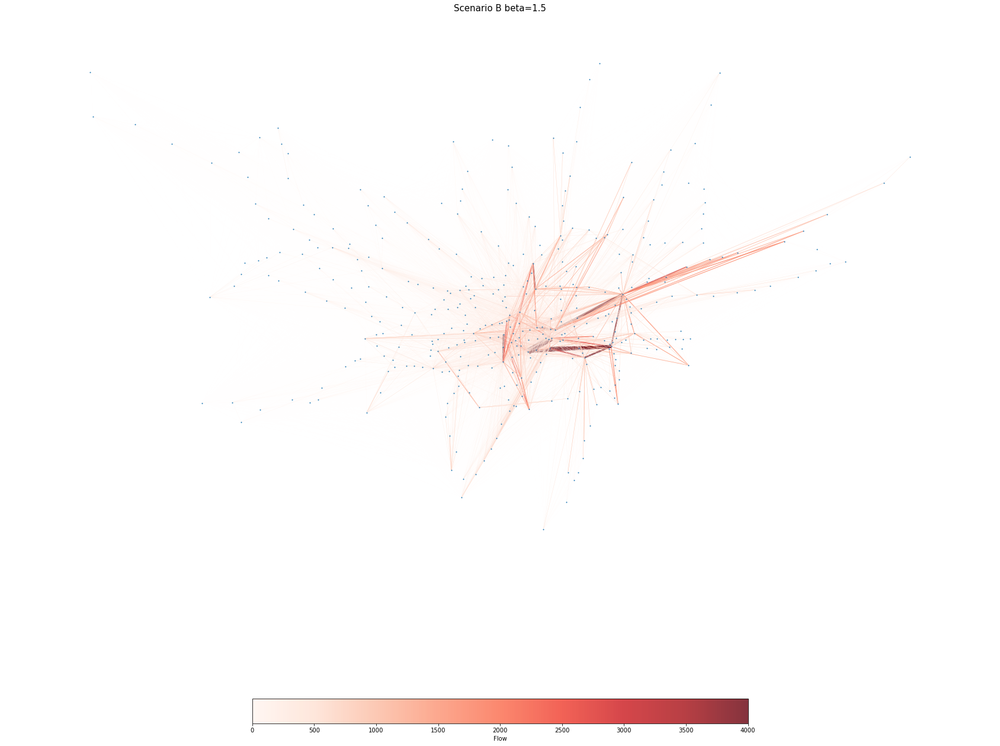

In [114]:
pos = nx.get_node_attributes(G_B , 'coords')

fig, ax = plt.subplots(figsize=(30,25))
edg = nx.draw_networkx_edges(G_B, pos, edge_color=edge_c, width=norm, edge_cmap=plt.get_cmap('Reds'), edge_vmin=0, edge_vmax=4000,alpha=0.8)
#nx.draw_networkx_labels(G_B, pos, font_size=10, font_color='black')
nx.draw_networkx_nodes(G_B, pos = pos,  node_size= 1)

plt.colorbar(edg, label="Flow",orientation="horizontal", shrink=0.5 )
plt.axis("off")
plt.title("Scenario B beta=1.5",fontsize=15)
plt.show()

## S_B_2

In [70]:
G_B2 = G.copy()
G_B2.remove_edges_from(list(G_B2.edges()))
G_B2 = nx.MultiGraph(G_B2)

In [71]:
for node in G_B2.nodes():
    G_B2.nodes[node]['coords'] = eval(G_B2.nodes[node]['coords'])

In [72]:
for index,row in cdata[cdata['prodsimest_s22']!=0].iterrows():
    if row['station_origin'] in G_B2:
        if row['station_destination'] in G_B2:
            G_B2.add_edge(row['station_origin'], row['station_destination'], flow=row['flows'])

In [73]:
edge_c2 = []
for node1, node2, data in G_B2.edges(data=True):
    edge_c2.append(float(data['flow']))

In [74]:
norm2 = [float(i)*1000/sum(edge_c2) for i in edge_c2]

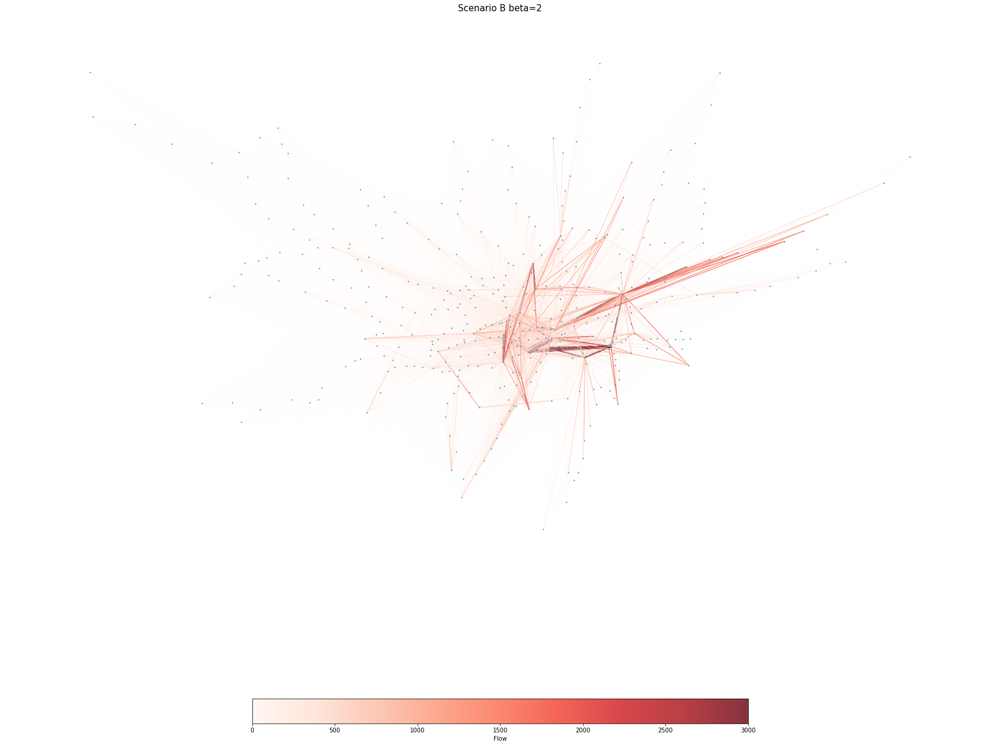

In [75]:
pos2 = nx.get_node_attributes(G_B2 , 'coords')

fig, ax = plt.subplots(figsize=(30,25))
edg = nx.draw_networkx_edges(G_B2, pos2, edge_color=edge_c2, width=norm2, edge_cmap=plt.get_cmap('Reds'), edge_vmin=0, edge_vmax=3000,alpha=0.8)
#nx.draw_networkx_labels(G_B, pos, font_size=10, font_color='black')
nx.draw_networkx_nodes(G_B2, pos = pos2,  node_size= 1)

plt.colorbar(edg, label="Flow",orientation="horizontal", shrink=0.5 )
plt.axis("off")
plt.title("Scenario B beta=2",fontsize=15)
plt.show()

## IIII.3

### A

In [76]:
cdata['S1_change'] = cdata['prodsimest3'] - cdata['prodsimest1']

In [77]:
print(min(cdata['S1_change']))

-962.3556118444203


In [78]:
cdata.head()

,station_origin,station_destination,flows,population,jobs,distance,log_population,log_jobs,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,attrsimFitted,doubsimfitted,new_jobs,Ai1,A_i,prodsimest3,Ai1_s2,A_i_s2,prodsimest_s2,Ai1_s22,A_i_s22,prodsimest_s22,S1_change
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,6.395262,11.271478,9.003504,50,49.617996,599,78549,3.250242,55.010681,53.0,55.0,78549.0,1.606161,0.057203,55.0,0.007893,4.162663,20.0,0.000088,138.388477,7.0,-0.010681
1,Abbey Road,Beckton,1,599,442,8510.121774,6.395262,6.091310,9.049012,1,0.937195,599,442,3.250242,0.986106,3.0,2.0,442.0,0.028750,0.057203,1.0,0.000138,4.162663,0.0,0.000001,138.388477,0.0,0.013894
2,Abbey Road,Blackwall,3,599,665,3775.448872,6.395262,6.499787,8.236275,2,2.121375,599,665,3.250242,2.755640,4.0,3.0,665.0,0.082424,0.057203,3.0,0.000637,4.162663,2.0,0.000010,138.388477,1.0,0.244360
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,6.395262,10.981421,8.534348,53,53.297014,599,58772,3.250242,66.457296,70.0,77.0,29386.0,1.155906,0.057203,40.0,0.012765,4.162663,32.0,0.000179,138.388477,15.0,-26.457296
4,Abbey Road,Canning Town,37,599,15428,2228.923167,6.395262,9.643939,7.709274,32,32.208586,599,15428,3.250242,49.060970,33.0,45.0,15428.0,1.492014,0.057203,51.0,0.015742,4.162663,39.0,0.000333,138.388477,28.0,1.939030


In [79]:
G_0 = G.copy()
G_0.remove_edges_from(list(G_0.edges()))
G_0 = nx.MultiGraph(G_0)
for node in G_0.nodes():
    G_0.nodes[node]['coords'] = eval(G_0.nodes[node]['coords'])
for index,row in cdata[cdata['S1_change']!=0].iterrows():
    if row['station_origin'] in G_0:
        if row['station_destination'] in G_0:
            G_0.add_edge(row['station_origin'], row['station_destination'], change=row['S1_change'])

In [80]:
edge_c30 = []
for node1, node2, data in G_0.edges(data=True):
    edge_c30.append(float(data['change']))

In [81]:
norm30 = edge_c30.copy()
max_value = max(edge_c30)
min_value = min(edge_c30)
for i in range(0, len(edge_c30)):
    #print(i)
    norm30[i] = (edge_c30[i] - min_value) / (max_value - min_value)

In [82]:
print(max(norm30))

1.0


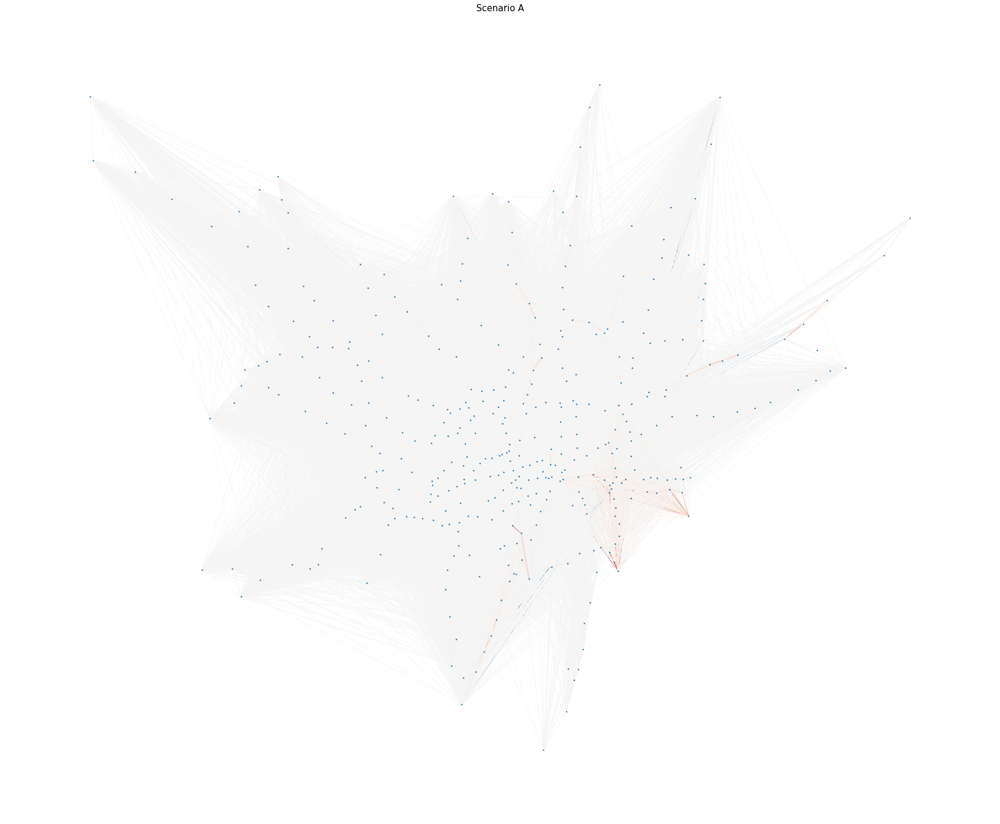

In [83]:
pos30 = nx.get_node_attributes(G_0 , 'coords')

fig, ax = plt.subplots(figsize=(30,25))
edg = nx.draw_networkx_edges(G_0, pos30, edge_color=edge_c30, width=norm30, edge_vmin=-50, edge_vmax=50, edge_cmap=plt.get_cmap('RdBu_r'),alpha=0.6)
#nx.draw_networkx_labels(G_B, pos, font_size=10, font_color='black')
nx.draw_networkx_nodes(G_0, pos = pos30,  node_size= 2)

#plt.colorbar(edg, label="Flow Change",orientation="horizontal", shrink=0.5)
plt.axis("off")
plt.title("Scenario A",fontsize=15)
plt.show()

### B1

In [84]:
cdata['S2_change'] = cdata['prodsimest_s2'] - cdata['prodsimest1']

In [85]:
cdata.head(10)

,station_origin,station_destination,flows,population,jobs,distance,log_population,log_jobs,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,attrsimFitted,doubsimfitted,new_jobs,Ai1,A_i,prodsimest3,Ai1_s2,A_i_s2,prodsimest_s2,Ai1_s22,A_i_s22,prodsimest_s22,S1_change,S2_change
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,6.395262,11.271478,9.003504,50,49.617996,599,78549,3.250242,55.010681,53.0,55.0,78549.0,1.606161,0.057203,55.0,0.007893,4.162663,20.0,0.000088,138.388477,7.0,-0.010681,-35.010681
1,Abbey Road,Beckton,1,599,442,8510.121774,6.395262,6.091310,9.049012,1,0.937195,599,442,3.250242,0.986106,3.0,2.0,442.0,0.028750,0.057203,1.0,0.000138,4.162663,0.0,0.000001,138.388477,0.0,0.013894,-0.986106
2,Abbey Road,Blackwall,3,599,665,3775.448872,6.395262,6.499787,8.236275,2,2.121375,599,665,3.250242,2.755640,4.0,3.0,665.0,0.082424,0.057203,3.0,0.000637,4.162663,2.0,0.000010,138.388477,1.0,0.244360,-0.755640
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,6.395262,10.981421,8.534348,53,53.297014,599,58772,3.250242,66.457296,70.0,77.0,29386.0,1.155906,0.057203,40.0,0.012765,4.162663,32.0,0.000179,138.388477,15.0,-26.457296,-34.457296
4,Abbey Road,Canning Town,37,599,15428,2228.923167,6.395262,9.643939,7.709274,32,32.208586,599,15428,3.250242,49.060970,33.0,45.0,15428.0,1.492014,0.057203,51.0,0.015742,4.162663,39.0,0.000333,138.388477,28.0,1.939030,-10.060970
5,Abbey Road,Crossharbour,1,599,1208,6686.475560,6.395262,7.096721,8.807842,2,2.340152,599,1208,3.250242,2.639418,5.0,3.0,1208.0,0.077540,0.057203,3.0,0.000428,4.162663,1.0,0.000005,138.388477,0.0,0.360582,-1.639418
6,Abbey Road,Custom House,0,599,845,3824.855630,6.395262,6.739337,8.249276,3,2.524914,599,845,3.250242,3.275120,5.0,4.0,845.0,0.097922,0.057203,3.0,0.000751,4.162663,2.0,0.000012,138.388477,1.0,-0.275120,-1.275120
7,Abbey Road,Cutty Sark,2,599,1748,8503.898909,6.395262,7.466228,9.048280,3,2.668661,599,1748,3.250242,2.838948,8.0,5.0,1748.0,0.082773,0.057203,3.0,0.000396,4.162663,1.0,0.000004,138.388477,0.0,0.161052,-1.838948
8,Abbey Road,Cyprus,7,599,850,6532.099618,6.395262,6.745236,8.784484,2,1.817327,599,850,3.250242,2.056310,5.0,4.0,850.0,0.060454,0.057203,2.0,0.000338,4.162663,1.0,0.000004,138.388477,0.0,-0.056310,-1.056310
9,Abbey Road,Devons Road,1,599,611,3958.324171,6.395262,6.415097,8.283576,2,1.931266,599,611,3.250242,2.476929,4.0,3.0,611.0,0.073977,0.057203,3.0,0.000556,4.162663,1.0,0.000009,138.388477,1.0,0.523071,-1.476929


In [86]:
print(cdata['distance'].mean())

16322.59352643154


In [87]:
print(cdata[cdata['distance']<16300]['S2_change'].mean())

2.156305797751899


Text(0.5, 1.0, 'Flow - distance (beta=2)')

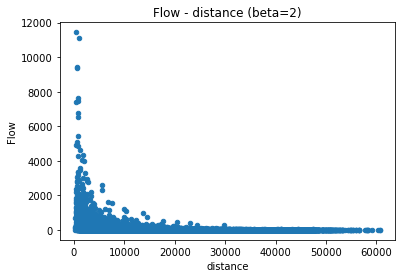

In [88]:
cdata.plot.scatter(x="distance", y="prodsimest_s22")
plt.ylabel('Flow')
plt.title('Flow - distance (beta=2)')

Text(0.5, 1.0, 'Flow - distance (beta=1.5)')

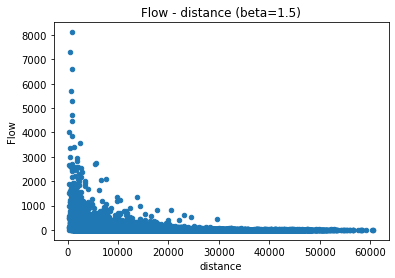

In [113]:

cdata.plot.scatter(x="distance", y="prodsimest_s2")
plt.ylabel('Flow')
plt.title('Flow - distance (beta=1.5)')

<AxesSubplot:xlabel='distance', ylabel='prodsimest1'>

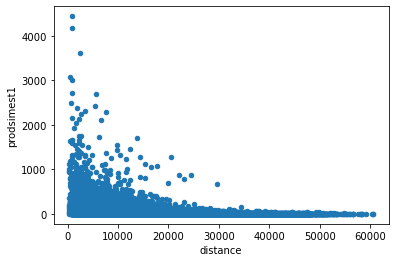

In [90]:
cdata.plot.scatter(x="distance", y="prodsimest1")

In [91]:
print(sum(cdata['prodsimest_s22']))

1541001.0


In [92]:
G_1 = G.copy()
G_1.remove_edges_from(list(G_1.edges()))
G_1 = nx.MultiGraph(G_1)
for node in G_1.nodes():
    G_1.nodes[node]['coords'] = eval(G_1.nodes[node]['coords'])
for index,row in cdata[cdata['S2_change']!=0].iterrows():
    if row['station_origin'] in G_1:
        if row['station_destination'] in G_1:
            G_1.add_edge(row['station_origin'], row['station_destination'], change=row['S2_change'])


In [93]:
list(G_1.edges(data = True))[0:10]

[('Wembley Park', 'Acton Town', {'change': -4.26439898592535}),
 ('Wembley Park', 'Acton Town', {'change': -2.1918653527874454}),
 ('Wembley Park', 'Aldgate', {'change': -3.059988322668847}),
 ('Wembley Park', 'Aldgate', {'change': -5.576155120154375}),
 ('Wembley Park', 'Aldgate East', {'change': -3.5855371630524058}),
 ('Wembley Park', 'Aldgate East', {'change': -6.67542519546582}),
 ('Wembley Park', 'Amersham', {'change': 2.2572863969830372}),
 ('Wembley Park', 'Amersham', {'change': -0.9099140553861707}),
 ('Wembley Park', 'Angel', {'change': -4.999949164121432}),
 ('Wembley Park', 'Angel', {'change': -2.17631272504417})]

In [94]:
edge_c31 = []
for node1, node2, data in G_1.edges(data=True):
    edge_c31.append(float(data['change']))
    
#norm31 = normalize_list(edge_c31)

In [95]:
norm31 = edge_c31.copy()
max_value = max(edge_c31)
min_value = min(edge_c31)
for i in range(0, len(edge_c31)):
    #print(i)
    norm31[i] = (edge_c31[i] - min_value)*10 / (max_value - min_value)

In [96]:
edge_c31[120]

-1.9730572107393423

In [97]:
print(norm31[:10])

[1.1574309448166398, 1.1617645177133207, 1.159949312346753, 1.1546881228235693, 1.1588504137937194, 1.1523895994469957, 1.1710674902334017, 1.164445019157764, 1.1558929430851297, 1.1617970375455602]


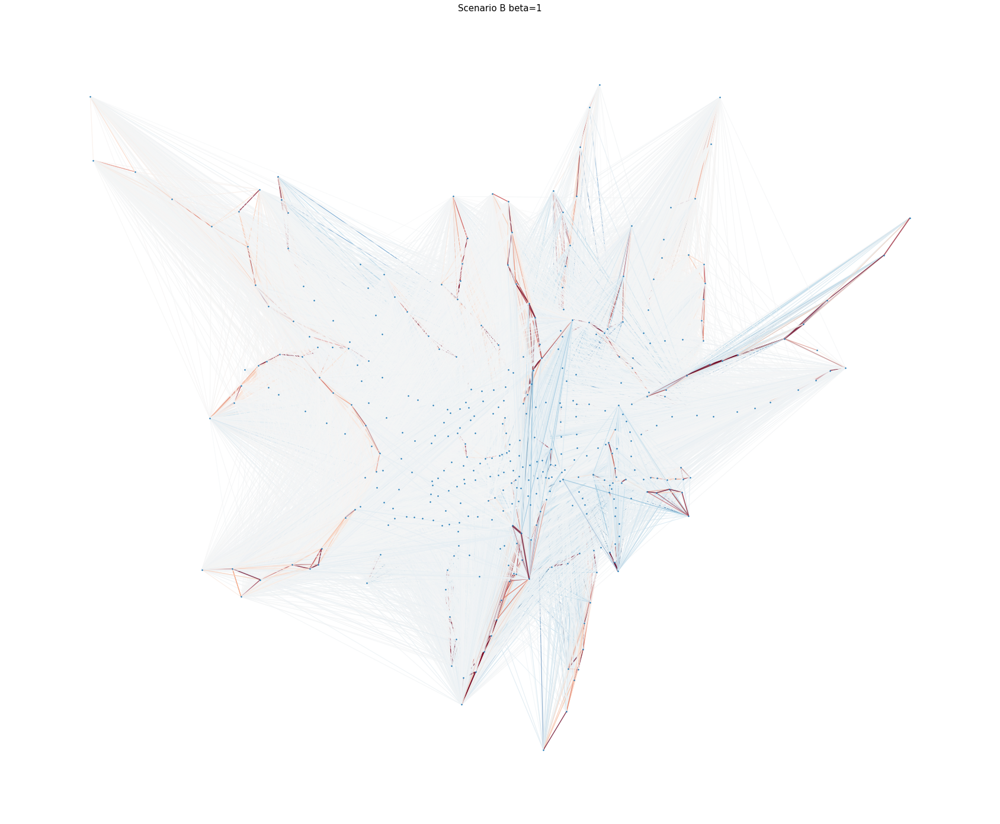

In [98]:
pos31 = nx.get_node_attributes(G_1 , 'coords')

fig, ax = plt.subplots(figsize=(30,25))
edg = nx.draw_networkx_edges(G_1, pos31, edge_color=edge_c31, width=norm31, edge_vmin=-50, edge_vmax=50, edge_cmap=plt.get_cmap('RdBu_r'),alpha=0.5)
#nx.draw_networkx_labels(G_B, pos, font_size=10, font_color='black')
nx.draw_networkx_nodes(G_1, pos = pos31,  node_size= 2)

#plt.colorbar(edg, label="Flow Change",orientation="horizontal", shrink=0.5)
plt.axis("off")
plt.title("Scenario B beta=1",fontsize=15)
plt.show()

### B2

In [99]:
cdata['S22_change'] = cdata['prodsimest_s22'] - cdata['prodsimest1']

In [100]:
print(cdata[cdata['distance']>16300]['S22_change'].mean())

-4.697636952480532


In [101]:
cdata.head()

,station_origin,station_destination,flows,population,jobs,distance,log_population,log_jobs,log_distance,unconstrainedEst2,fitted,O_i,D_j,alpha_i,prodsimest1,attrsimFitted,doubsimfitted,new_jobs,Ai1,A_i,prodsimest3,Ai1_s2,A_i_s2,prodsimest_s2,Ai1_s22,A_i_s22,prodsimest_s22,S1_change,S2_change,S22_change
0,Abbey Road,Bank and Monument,0,599,78549,8131.525097,6.395262,11.271478,9.003504,50,49.617996,599,78549,3.250242,55.010681,53.0,55.0,78549.0,1.606161,0.057203,55.0,0.007893,4.162663,20.0,0.000088,138.388477,7.0,-0.010681,-35.010681,-48.010681
1,Abbey Road,Beckton,1,599,442,8510.121774,6.395262,6.091310,9.049012,1,0.937195,599,442,3.250242,0.986106,3.0,2.0,442.0,0.028750,0.057203,1.0,0.000138,4.162663,0.0,0.000001,138.388477,0.0,0.013894,-0.986106,-0.986106
2,Abbey Road,Blackwall,3,599,665,3775.448872,6.395262,6.499787,8.236275,2,2.121375,599,665,3.250242,2.755640,4.0,3.0,665.0,0.082424,0.057203,3.0,0.000637,4.162663,2.0,0.000010,138.388477,1.0,0.244360,-0.755640,-1.755640
3,Abbey Road,Canary Wharf,1,599,58772,5086.514220,6.395262,10.981421,8.534348,53,53.297014,599,58772,3.250242,66.457296,70.0,77.0,29386.0,1.155906,0.057203,40.0,0.012765,4.162663,32.0,0.000179,138.388477,15.0,-26.457296,-34.457296,-51.457296
4,Abbey Road,Canning Town,37,599,15428,2228.923167,6.395262,9.643939,7.709274,32,32.208586,599,15428,3.250242,49.060970,33.0,45.0,15428.0,1.492014,0.057203,51.0,0.015742,4.162663,39.0,0.000333,138.388477,28.0,1.939030,-10.060970,-21.060970


In [102]:
print(sum(cdata['prodsimest_s22']))

1541001.0


In [103]:
print(sum(cdata['prodsimest3']))

1541971.0


In [104]:
print(sum(cdata['prodsimest_s2']))

1541516.0


In [105]:
print(sum(cdata['S22_change']))

-1281.9999999655558


In [106]:
G_2 = G.copy()
G_2.remove_edges_from(list(G_2.edges()))
G_2 = nx.MultiGraph(G_2)
for node in G_2.nodes():
    G_2.nodes[node]['coords'] = eval(G_2.nodes[node]['coords'])
for index,row in cdata[cdata['S22_change']!=0].iterrows():
    if row['station_origin'] in G_2:
        if row['station_destination'] in G_2:
            G_2.add_edge(row['station_origin'], row['station_destination'], change=row['S22_change'])

In [107]:
edge_c32 = []
for node1, node2, data in G_2.edges(data=True):
    edge_c32.append(float(data['change']))

In [108]:
norm32 = edge_c32.copy()
max_value = max(edge_c32)
min_value = min(edge_c32)
for i in range(0, len(edge_c32)):
    #print(i)
    norm32[i] = (edge_c32[i] - min_value) / (max_value - min_value)

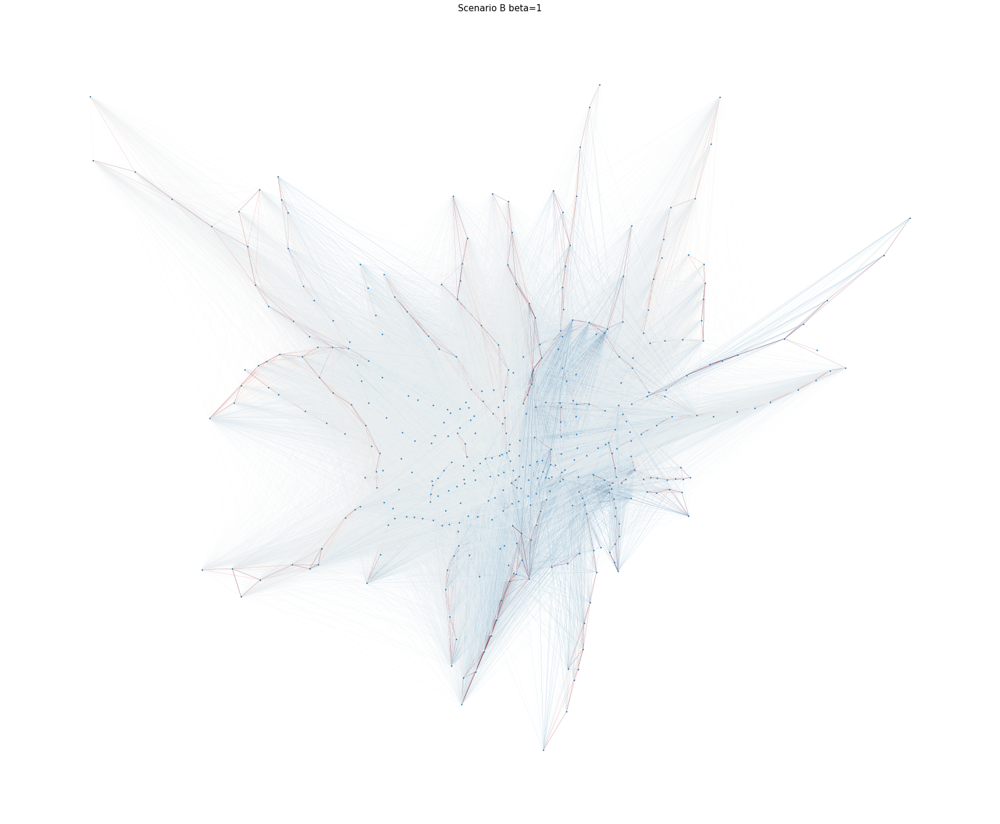

In [109]:
pos32 = nx.get_node_attributes(G_2 , 'coords')

fig, ax = plt.subplots(figsize=(30,25))
edg = nx.draw_networkx_edges(G_2, pos32, edge_color=edge_c32, width=norm32, edge_vmin=-50, edge_vmax=50, edge_cmap=plt.get_cmap('RdBu_r'),alpha=1)
#nx.draw_networkx_labels(G_B, pos, font_size=10, font_color='black')
nx.draw_networkx_nodes(G_2, pos = pos32,  node_size= 2)

#plt.colorbar(edg, label="Flow Change",orientation="horizontal", shrink=0.5)
plt.axis("off")
plt.title("Scenario B beta=1",fontsize=15)
plt.show()

In [110]:
cdata[cdata['flows']>=10]['flows'].head()

4      37
24    285
25     10
26     33
27    130
Name: flows, dtype: int64